In [1]:
# import os

# os.environ["KERAS_BACKEND"] = "tensorflow"

# Setting random seed to obtain reproducible results.
import tensorflow as tf

tf.random.set_seed(42)

import keras
from keras import layers

import os
import glob
import imageio.v2 as imageio
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

# Initialize global variables.
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 5
# NUM_SAMPLES = 32
POS_ENCODE_DIMS = 16
EPOCHS = 100

NUM_SAMPLES_COARSE = 64
NUM_SAMPLES_FINE_IMPORTANCE = 64

2025-05-12 15:56:29.358433: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-12 15:56:29.399551: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-12 15:56:29.971654: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
# Download the data if it does not already exist.
url = (
    "http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz"
)
data = tf.keras.utils.get_file(origin=url)

data = np.load(data)
images = data["images"]
im_shape = images.shape
(num_images, H, W, _) = images.shape
(poses, focal) = (data["poses"], data["focal"])

# Plot a random image from the dataset for visualization.
# plt.imshow(images[np.random.randint(low=0, high=num_images)])
# plt.show()

In [3]:
def sample_pdf(bins, weights, N_samples, det=False):
    weights = weights + 1e-5
    pdf = weights / tf.reduce_sum(weights, axis=-1, keepdims=True)
    cdf = tf.cumsum(pdf, axis=-1)
    cdf = tf.concat([tf.zeros_like(cdf[..., :1]), cdf], axis=-1)

    if det:
        u = tf.linspace(0.0, 1.0, N_samples)
        u_shape = tf.concat([tf.shape(cdf)[:-1], [N_samples]], axis=0)
        u = tf.broadcast_to(u, u_shape)
    else:
        u_shape = tf.concat([tf.shape(cdf)[:-1], [N_samples]], axis=0)
        u = tf.random.uniform(u_shape)

    inds = tf.searchsorted(cdf, u, side='right')

    below = tf.maximum(0, inds - 1)
    above = tf.minimum(tf.shape(cdf)[-1] - 1, inds)
    inds_g = tf.stack([below, above], axis=-1)

    batch_dims_for_gather = cdf.shape.rank - 1
    if batch_dims_for_gather < 0: # rank가 None일 경우 대비
        # 이 경우, 입력 데이터의 일반적인 배치 차원 수를 가정해야 합니다.
        # 예를 들어 (B, H, W, N_points) 형태라면 배치 차원은 3개.
        # 이 값은 컨텍스트에 따라 달라지므로 주의해야 합니다.
        # 보다 안전하게는, 이 함수를 호출하는 부분에서 batch_dims를 명시적으로 계산하여 전달하거나,
        # 또는 입력 텐서의 정적 shape이 보장되도록 해야 합니다.
        # 여기서는 일단 0 이상으로 가정하고 진행합니다. (에러 방지 목적)
        # 실제로는 이 분기에 들어오지 않도록 shape 관리가 필요합니다.
        batch_dims_for_gather = tf.maximum(0, tf.rank(cdf) -1)


    # bins와 cdf의 배치 차원 수가 동일하다고 가정합니다.
    # 만약 bins.shape.rank가 None이면, cdf와 동일한 batch_dims 사용 시도
    if bins.shape.rank is not None and cdf.shape.rank is not None and bins.shape.rank != cdf.shape.rank:
        # 이 경우, gather 연산을 위해 batch_dims를 어떻게 설정할지 더 신중한 고려가 필요.
        # 여기서는 cdf의 batch_dims를 기준으로 함.
        pass


    cdf_g = tf.gather(cdf, inds_g, batch_dims=batch_dims_for_gather)
    bins_g = tf.gather(bins, inds_g, batch_dims=batch_dims_for_gather)

    denom = cdf_g[..., 1] - cdf_g[..., 0]
    denom = tf.where(denom < 1e-5, tf.ones_like(denom), denom)
    t = (u - cdf_g[..., 0]) / denom
    samples = bins_g[..., 0] + t * (bins_g[..., 1] - bins_g[..., 0])
    return samples

In [4]:

def encode_position(x):
    """Encodes the position into its corresponding Fourier feature.

    Args:
        x: The input coordinate.

    Returns:
        Fourier features tensors of the position.
    """
    positions = [x]
    for i in range(POS_ENCODE_DIMS):
        for fn in [tf.sin, tf.cos]:
            positions.append(fn(2.0**i * x))
    return tf.concat(positions, axis=-1)


def get_rays(height, width, focal, pose):
    """Computes origin point and direction vector of rays.

    Args:
        height: Height of the image.
        width: Width of the image.
        focal: The focal length between the images and the camera.
        pose: The pose matrix of the camera.

    Returns:
        Tuple of origin point and direction vector for rays.
    """
    # Build a meshgrid for the rays.
    i, j = tf.meshgrid(
        tf.range(width, dtype=tf.float32),
        tf.range(height, dtype=tf.float32),
        indexing="xy",
    )

    # Normalize the x axis coordinates.
    transformed_i = (i - width * 0.5) / focal

    # Normalize the y axis coordinates.
    transformed_j = (j - height * 0.5) / focal

    # Create the direction unit vectors.
    directions = tf.stack([transformed_i, -transformed_j, -tf.ones_like(i)], axis=-1)

    # Get the camera matrix.
    camera_matrix = pose[:3, :3]
    height_width_focal = pose[:3, -1]

    # Get origins and directions for the rays.
    transformed_dirs = directions[..., None, :]
    camera_dirs = transformed_dirs * camera_matrix
    ray_directions = tf.reduce_sum(camera_dirs, axis=-1)
    ray_origins = tf.broadcast_to(height_width_focal, tf.shape(ray_directions))

    # Return the origins and directions.
    return (ray_origins, ray_directions)

def render_flat_rays_for_coarse(ray_origins, ray_directions, near, far, num_samples, perturb=False):
    if perturb:
        shape_prefix = tf.shape(ray_origins)[:-1]
        bin_starts_flat = tf.linspace(near, far, num_samples + 1)[:-1]
        
        shape_prefix_dims_len = tf.rank(ray_origins) - 1
        view_shape_for_linspace = tf.concat([tf.ones(shape_prefix_dims_len, dtype=tf.int32), [num_samples]], axis=0)
        bin_starts_b = tf.reshape(bin_starts_flat, view_shape_for_linspace)
        
        bin_width = (far - near) / num_samples
        
        rand_shape = tf.concat([shape_prefix, [num_samples]], axis=0)
        random_offsets = tf.random.uniform(shape=rand_shape) * bin_width
        
        t_vals_shaped = bin_starts_b + random_offsets
    else:
        _t_vals_flat = tf.linspace(near, far, num_samples)
        shape_prefix = tf.shape(ray_origins)[:-1]
        t_vals_shaped = tf.broadcast_to(_t_vals_flat, tf.concat([shape_prefix, [num_samples]], axis=0))

    rays = ray_origins[..., None, :] + (
        ray_directions[..., None, :] * t_vals_shaped[..., None]
    )
    
    rays_flat = tf.reshape(rays, [-1, 3])
    rays_flat_encoded = encode_position(rays_flat)
    
    return (rays_flat_encoded, t_vals_shaped)

def map_fn(pose):
    (ray_origins, ray_directions) = get_rays(height=H, width=W, focal=focal, pose=pose)
    return (ray_origins, ray_directions)

# Create the training split.
split_index = int(num_images * 0.8)

# Split the images into training and validation.
train_images = images[:split_index]
val_images = images[split_index:]

# Split the poses into training and validation.
train_poses = poses[:split_index]
val_poses = poses[split_index:]

# Make the training pipeline.
train_img_ds = tf.data.Dataset.from_tensor_slices(train_images)
train_pose_ds = tf.data.Dataset.from_tensor_slices(train_poses)
train_ray_ds = train_pose_ds.map(map_fn, num_parallel_calls=AUTO)
training_ds = tf.data.Dataset.zip((train_img_ds, train_ray_ds))
train_ds = (
    training_ds.shuffle(BATCH_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True, num_parallel_calls=AUTO)
    .prefetch(AUTO)
)

# Make the validation pipeline.
val_img_ds = tf.data.Dataset.from_tensor_slices(val_images)
val_pose_ds = tf.data.Dataset.from_tensor_slices(val_poses)
val_ray_ds = val_pose_ds.map(map_fn, num_parallel_calls=AUTO)
validation_ds = tf.data.Dataset.zip((val_img_ds, val_ray_ds))
val_ds = (
    validation_ds.shuffle(BATCH_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True, num_parallel_calls=AUTO)
    .prefetch(AUTO)
)

2025-05-12 15:56:43.780556: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 28622 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:2a:00.0, compute capability: 8.6
2025-05-12 15:56:43.781394: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 977 MB memory:  -> device: 1, name: NVIDIA RTX A6000, pci bus id: 0000:3d:00.0, compute capability: 8.6
2025-05-12 15:56:43.781772: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 32714 MB memory:  -> device: 2, name: NVIDIA RTX A6000, pci bus id: 0000:cf:00.0, compute capability: 8.6


In [5]:
SINGLE_COORD_ENCODED_DIMS = 2 * 3 * POS_ENCODE_DIMS + 3

def get_nerf_model_modified(num_layers, encoded_dims_per_coord):
    inputs = keras.Input(shape=(encoded_dims_per_coord,))
    x = inputs
    for i in range(num_layers):
        x = layers.Dense(units=64, activation="relu")(x)
        if i % 4 == 0 and i > 0:
            x = layers.concatenate([x, inputs], axis=-1)
    outputs = layers.Dense(units=4)(x)
    return keras.Model(inputs=inputs, outputs=outputs)

def render_rays_hierarchical(
    model_coarse,
    model_fine,
    ray_origins,
    ray_directions,
    near,
    far,
    perturb_coarse=True,
    train=True # 이 train 인자를 모델 호출 시 training 인자로 사용
    ):

    current_batch_size = tf.shape(ray_origins)[0]
    h_dim = tf.shape(ray_origins)[1]
    w_dim = tf.shape(ray_origins)[2]

    rays_flat_coarse_encoded, t_vals_coarse = render_flat_rays_for_coarse(
        ray_origins, ray_directions, near, far, NUM_SAMPLES_COARSE, perturb=perturb_coarse
    )

    # 모델 호출 시 .predict() 대신 직접 호출하고 training 인자 전달
    predictions_coarse_flat = model_coarse(rays_flat_coarse_encoded, training=train)

    predictions_coarse = tf.reshape(
        predictions_coarse_flat,
        shape=(current_batch_size, h_dim, w_dim, NUM_SAMPLES_COARSE, 4)
    )

    rgb_coarse_samples = tf.sigmoid(predictions_coarse[..., :-1])
    sigma_a_coarse_samples = tf.nn.relu(predictions_coarse[..., -1])

    delta_coarse = t_vals_coarse[..., 1:] - t_vals_coarse[..., :-1]
    delta_coarse = tf.concat(
        [delta_coarse, tf.broadcast_to([1e10], shape=tf.concat([tf.shape(delta_coarse)[:-1],[1]], axis=0) )], axis=-1
    )

    alpha_coarse = 1.0 - tf.exp(-sigma_a_coarse_samples * delta_coarse)
    epsilon = 1e-10
    transmittance_coarse = tf.math.cumprod(1.0 - alpha_coarse + epsilon, axis=-1, exclusive=True)
    weights_coarse = alpha_coarse * transmittance_coarse

    rgb_coarse = tf.reduce_sum(weights_coarse[..., None] * rgb_coarse_samples, axis=-2)
    depth_coarse = tf.reduce_sum(weights_coarse * t_vals_coarse, axis=-1)
    acc_coarse = tf.reduce_sum(weights_coarse, axis=-1)

    t_vals_mid_coarse = .5 * (t_vals_coarse[..., 1:] + t_vals_coarse[..., :-1])
    weights_for_pdf = weights_coarse[..., :-1]

    t_samples_fine_importance = sample_pdf(
        bins=t_vals_mid_coarse,
        weights=weights_for_pdf,
        N_samples=NUM_SAMPLES_FINE_IMPORTANCE,
        det=not train
    )
    t_samples_fine_importance = tf.stop_gradient(t_samples_fine_importance)

    t_vals_fine_combined = tf.sort(
        tf.concat([t_vals_coarse, t_samples_fine_importance], axis=-1), axis=-1
    )

    rays_fine = ray_origins[..., None, :] + (
        ray_directions[..., None, :] * t_vals_fine_combined[..., None]
    )
    
    rays_fine_flat = tf.reshape(rays_fine, [-1, 3])
    rays_fine_flat_encoded = encode_position(rays_fine_flat)

    # 모델 호출 시 .predict() 대신 직접 호출하고 training 인자 전달
    predictions_fine_flat = model_fine(rays_fine_flat_encoded, training=train)
    
    num_total_fine_samples = NUM_SAMPLES_COARSE + NUM_SAMPLES_FINE_IMPORTANCE
    predictions_fine = tf.reshape(
        predictions_fine_flat,
        shape=(current_batch_size, h_dim, w_dim, num_total_fine_samples, 4)
    )

    rgb_fine_samples = tf.sigmoid(predictions_fine[..., :-1])
    sigma_a_fine_samples = tf.nn.relu(predictions_fine[..., -1])

    delta_fine = t_vals_fine_combined[..., 1:] - t_vals_fine_combined[..., :-1]
    delta_fine = tf.concat(
        [delta_fine, tf.broadcast_to([1e10], shape=tf.concat([tf.shape(delta_fine)[:-1],[1]], axis=0))], axis=-1
    )

    alpha_fine = 1.0 - tf.exp(-sigma_a_fine_samples * delta_fine)
    transmittance_fine = tf.math.cumprod(1.0 - alpha_fine + epsilon, axis=-1, exclusive=True)
    weights_fine = alpha_fine * transmittance_fine

    rgb_fine = tf.reduce_sum(weights_fine[..., None] * rgb_fine_samples, axis=-2)
    depth_fine = tf.reduce_sum(weights_fine * t_vals_fine_combined, axis=-1)
    acc_fine = tf.reduce_sum(weights_fine, axis=-1)
    
    extras = {
        "rgb_coarse": rgb_coarse,
        "depth_coarse": depth_coarse,
        "acc_coarse": acc_coarse,
        "acc_fine": acc_fine,
    }

    return rgb_fine, depth_fine, extras

Epoch 1/100


2025-05-12 15:57:17.717267: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2025-05-12 15:57:17.798850: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x71f9fc0a09f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-12 15:57:17.798911: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A6000, Compute Capability 8.6
2025-05-12 15:57:17.798926: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (1): NVIDIA RTX A6000, Compute Capability 8.6
2025-05-12 15:57:17.798937: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (2): NVIDIA RTX A6000, Compute Capability 8.6
2025-05-12 15:57:17.815446: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to ena

16/16 [==============================] - ETA: 0s - loss: 0.2466 - coarse_loss: 0.0985 - fine_loss: 0.0989 - coarse_psnr: 10.2873 - psnr: 9.0718

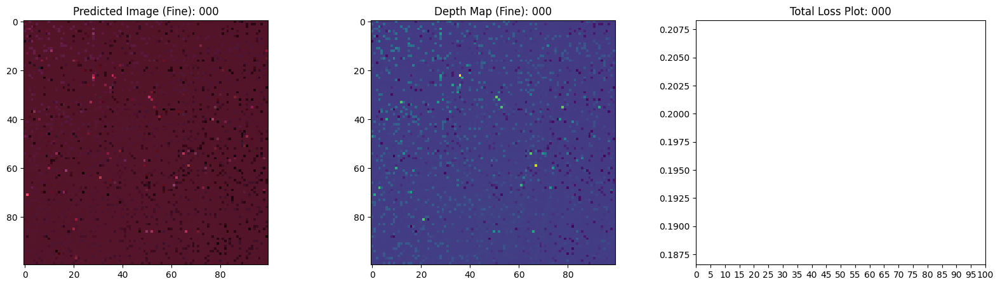

16/16 [==============================] - 16s 746ms/step - loss: 0.2437 - coarse_loss: 0.0985 - fine_loss: 0.0989 - coarse_psnr: 10.2873 - psnr: 9.1601 - val_loss: 0.1489 - val_coarse_loss: 0.0733 - val_fine_loss: 0.0756 - val_coarse_psnr: 11.7612 - val_psnr: 11.7473
Epoch 2/100
16/16 [==============================] - ETA: 0s - loss: 0.1289 - coarse_loss: 0.0656 - fine_loss: 0.0638 - coarse_psnr: 12.3167 - psnr: 12.4613

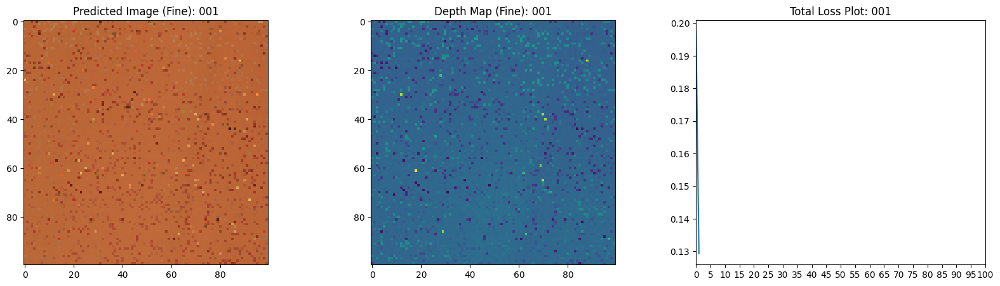

16/16 [==============================] - 12s 730ms/step - loss: 0.1289 - coarse_loss: 0.0656 - fine_loss: 0.0638 - coarse_psnr: 12.3167 - psnr: 12.4600 - val_loss: 0.1368 - val_coarse_loss: 0.0647 - val_fine_loss: 0.0721 - val_coarse_psnr: 12.2124 - val_psnr: 11.7065
Epoch 3/100
16/16 [==============================] - ETA: 0s - loss: 0.1152 - coarse_loss: 0.0558 - fine_loss: 0.0588 - coarse_psnr: 12.9761 - psnr: 12.6310

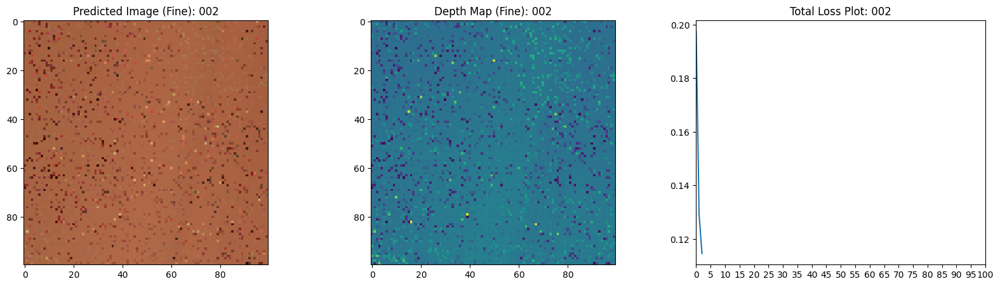

16/16 [==============================] - 11s 722ms/step - loss: 0.1152 - coarse_loss: 0.0558 - fine_loss: 0.0588 - coarse_psnr: 12.9761 - psnr: 12.6346 - val_loss: 0.1282 - val_coarse_loss: 0.0576 - val_fine_loss: 0.0706 - val_coarse_psnr: 12.7994 - val_psnr: 11.8741
Epoch 4/100
16/16 [==============================] - ETA: 0s - loss: 0.1062 - coarse_loss: 0.0472 - fine_loss: 0.0581 - coarse_psnr: 13.7017 - psnr: 12.8419

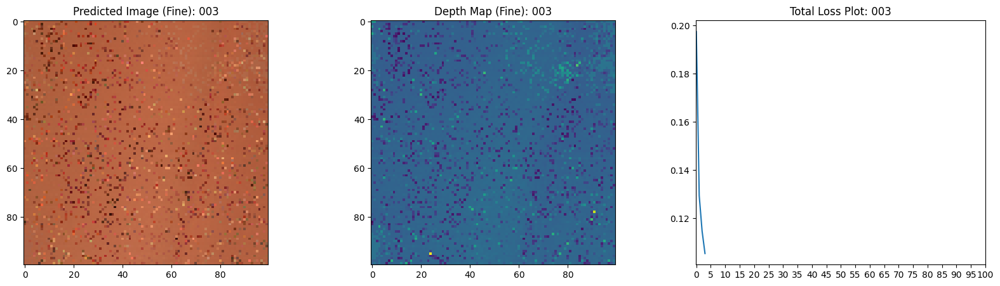

16/16 [==============================] - 11s 720ms/step - loss: 0.1061 - coarse_loss: 0.0472 - fine_loss: 0.0581 - coarse_psnr: 13.7017 - psnr: 12.8393 - val_loss: 0.1127 - val_coarse_loss: 0.0431 - val_fine_loss: 0.0696 - val_coarse_psnr: 13.9184 - val_psnr: 11.9288
Epoch 5/100
16/16 [==============================] - ETA: 0s - loss: 0.0927 - coarse_loss: 0.0363 - fine_loss: 0.0568 - coarse_psnr: 14.7147 - psnr: 12.9701

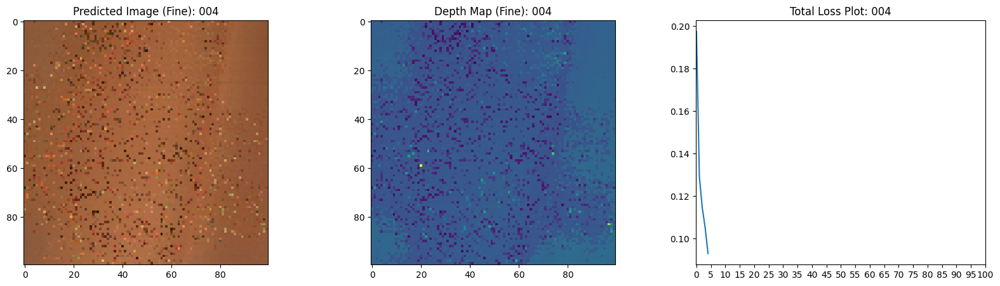

16/16 [==============================] - 11s 722ms/step - loss: 0.0928 - coarse_loss: 0.0363 - fine_loss: 0.0568 - coarse_psnr: 14.7147 - psnr: 12.9656 - val_loss: 0.1041 - val_coarse_loss: 0.0337 - val_fine_loss: 0.0704 - val_coarse_psnr: 14.8697 - val_psnr: 11.8622
Epoch 6/100
16/16 [==============================] - ETA: 0s - loss: 0.0863 - coarse_loss: 0.0312 - fine_loss: 0.0540 - coarse_psnr: 15.2711 - psnr: 13.0291

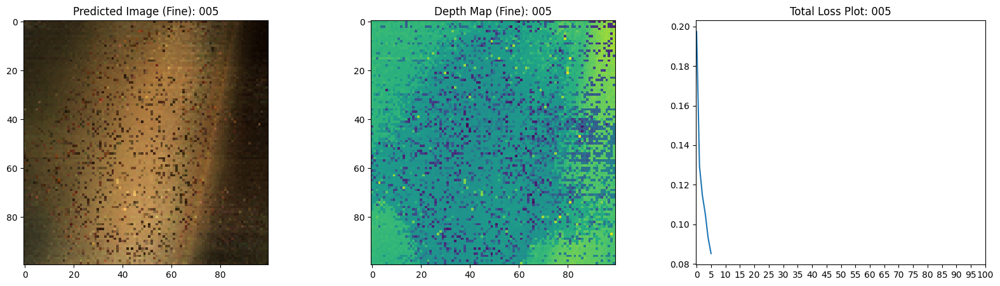

16/16 [==============================] - 11s 724ms/step - loss: 0.0862 - coarse_loss: 0.0312 - fine_loss: 0.0540 - coarse_psnr: 15.2711 - psnr: 13.0326 - val_loss: 0.0966 - val_coarse_loss: 0.0305 - val_fine_loss: 0.0661 - val_coarse_psnr: 15.3021 - val_psnr: 12.0926
Epoch 7/100
16/16 [==============================] - ETA: 0s - loss: 0.0739 - coarse_loss: 0.0281 - fine_loss: 0.0442 - coarse_psnr: 15.7337 - psnr: 13.7799

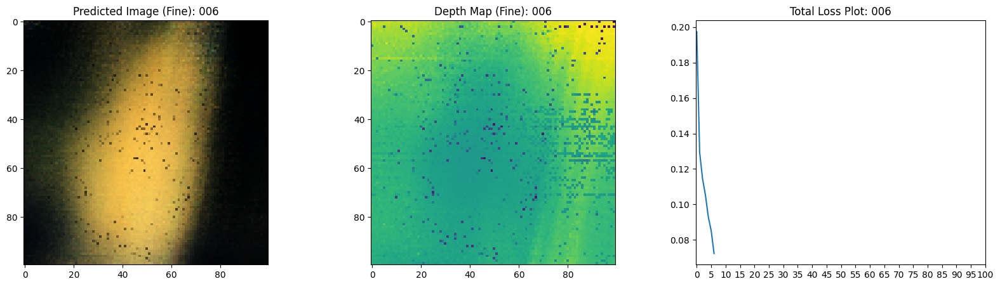

16/16 [==============================] - 11s 725ms/step - loss: 0.0738 - coarse_loss: 0.0281 - fine_loss: 0.0442 - coarse_psnr: 15.7337 - psnr: 13.7912 - val_loss: 0.0734 - val_coarse_loss: 0.0281 - val_fine_loss: 0.0454 - val_coarse_psnr: 15.6086 - val_psnr: 13.6880
Epoch 8/100
16/16 [==============================] - ETA: 0s - loss: 0.0612 - coarse_loss: 0.0266 - fine_loss: 0.0339 - coarse_psnr: 15.9972 - psnr: 14.8896

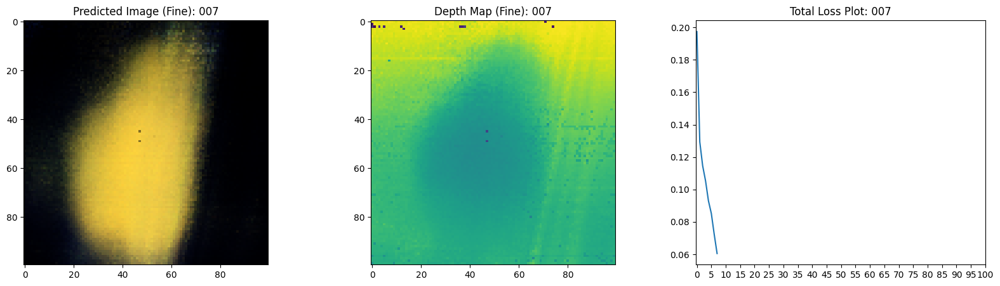

16/16 [==============================] - 12s 726ms/step - loss: 0.0612 - coarse_loss: 0.0266 - fine_loss: 0.0339 - coarse_psnr: 15.9972 - psnr: 14.8974 - val_loss: 0.0553 - val_coarse_loss: 0.0252 - val_fine_loss: 0.0301 - val_coarse_psnr: 16.1457 - val_psnr: 15.4196
Epoch 9/100
16/16 [==============================] - ETA: 0s - loss: 0.0538 - coarse_loss: 0.0243 - fine_loss: 0.0284 - coarse_psnr: 16.3675 - psnr: 15.5929

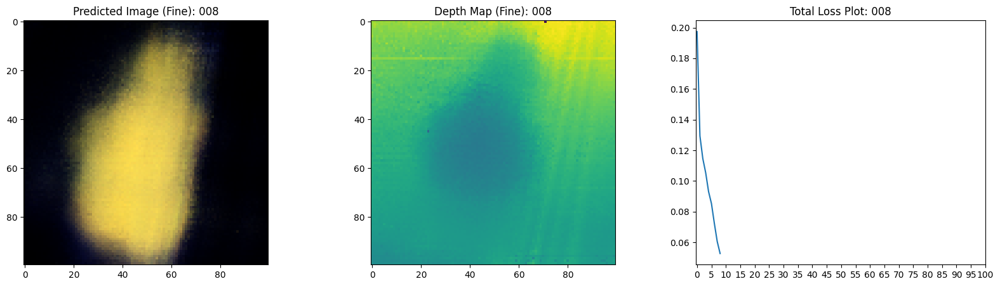

16/16 [==============================] - 12s 726ms/step - loss: 0.0537 - coarse_loss: 0.0243 - fine_loss: 0.0284 - coarse_psnr: 16.3675 - psnr: 15.6012 - val_loss: 0.0536 - val_coarse_loss: 0.0239 - val_fine_loss: 0.0297 - val_coarse_psnr: 16.3072 - val_psnr: 15.3653
Epoch 10/100
16/16 [==============================] - ETA: 0s - loss: 0.0485 - coarse_loss: 0.0223 - fine_loss: 0.0252 - coarse_psnr: 16.7153 - psnr: 16.1025

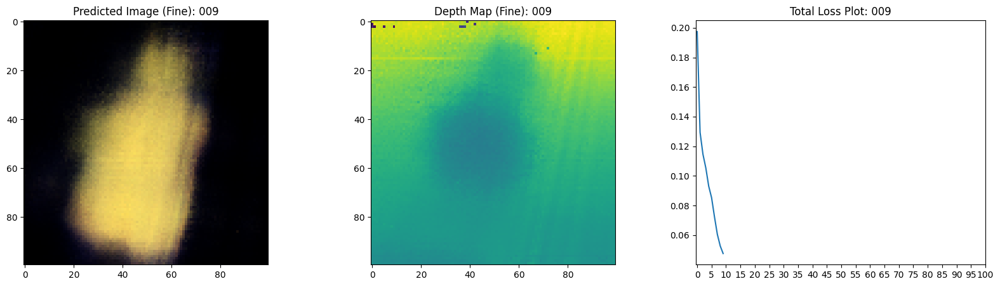

16/16 [==============================] - 12s 727ms/step - loss: 0.0484 - coarse_loss: 0.0223 - fine_loss: 0.0252 - coarse_psnr: 16.7153 - psnr: 16.1101 - val_loss: 0.0465 - val_coarse_loss: 0.0213 - val_fine_loss: 0.0251 - val_coarse_psnr: 16.8247 - val_psnr: 16.1110
Epoch 11/100
16/16 [==============================] - ETA: 0s - loss: 0.0457 - coarse_loss: 0.0217 - fine_loss: 0.0227 - coarse_psnr: 16.8265 - psnr: 16.5169

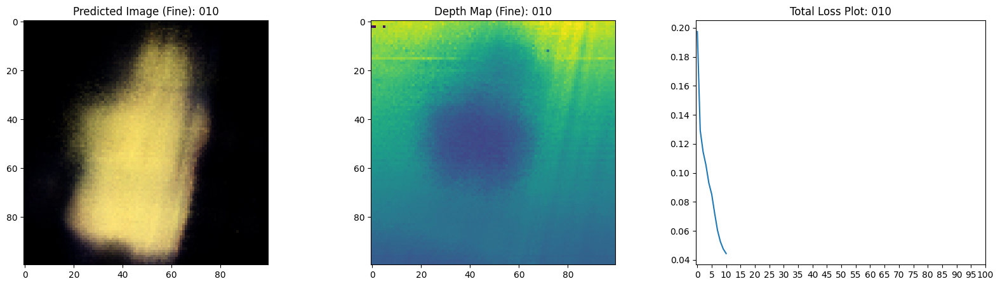

16/16 [==============================] - 12s 742ms/step - loss: 0.0456 - coarse_loss: 0.0217 - fine_loss: 0.0227 - coarse_psnr: 16.8265 - psnr: 16.5256 - val_loss: 0.0425 - val_coarse_loss: 0.0198 - val_fine_loss: 0.0227 - val_coarse_psnr: 17.1607 - val_psnr: 16.5080
Epoch 12/100
16/16 [==============================] - ETA: 0s - loss: 0.0412 - coarse_loss: 0.0194 - fine_loss: 0.0203 - coarse_psnr: 17.2921 - psnr: 16.9210

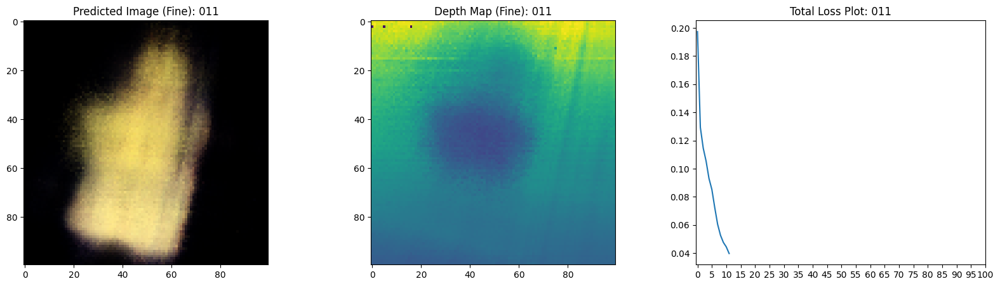

16/16 [==============================] - 12s 727ms/step - loss: 0.0411 - coarse_loss: 0.0194 - fine_loss: 0.0203 - coarse_psnr: 17.2921 - psnr: 16.9319 - val_loss: 0.0387 - val_coarse_loss: 0.0187 - val_fine_loss: 0.0201 - val_coarse_psnr: 17.4353 - val_psnr: 17.0240
Epoch 13/100
16/16 [==============================] - ETA: 0s - loss: 0.0374 - coarse_loss: 0.0177 - fine_loss: 0.0185 - coarse_psnr: 17.6942 - psnr: 17.2807

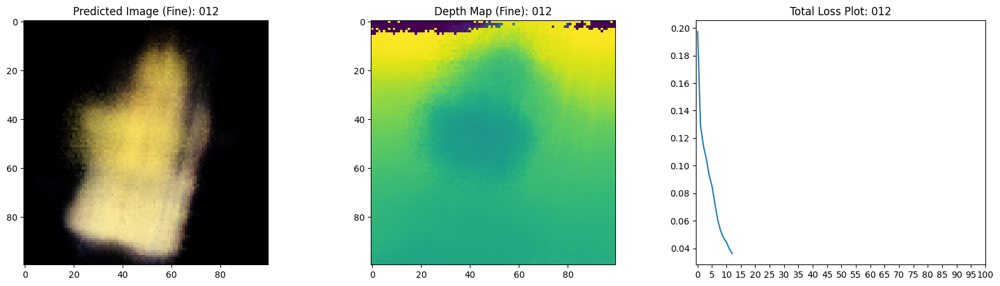

16/16 [==============================] - 12s 727ms/step - loss: 0.0374 - coarse_loss: 0.0177 - fine_loss: 0.0185 - coarse_psnr: 17.6942 - psnr: 17.2934 - val_loss: 0.0357 - val_coarse_loss: 0.0180 - val_fine_loss: 0.0176 - val_coarse_psnr: 17.4969 - val_psnr: 17.5688
Epoch 14/100
16/16 [==============================] - ETA: 0s - loss: 0.0353 - coarse_loss: 0.0172 - fine_loss: 0.0171 - coarse_psnr: 17.8144 - psnr: 17.6797

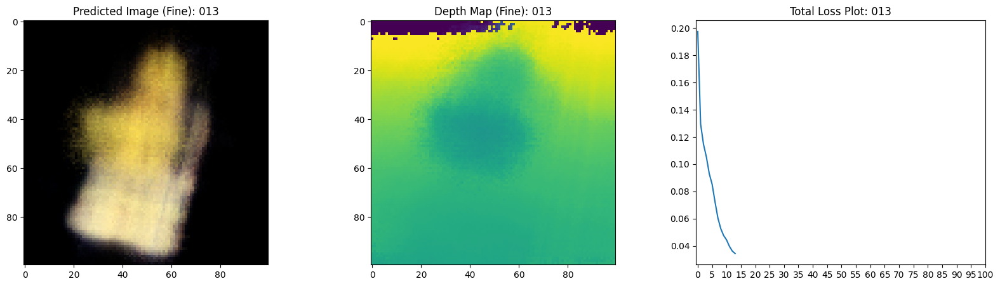

16/16 [==============================] - 12s 728ms/step - loss: 0.0353 - coarse_loss: 0.0172 - fine_loss: 0.0171 - coarse_psnr: 17.8144 - psnr: 17.6892 - val_loss: 0.0322 - val_coarse_loss: 0.0166 - val_fine_loss: 0.0156 - val_coarse_psnr: 17.8622 - val_psnr: 18.1238
Epoch 15/100
16/16 [==============================] - ETA: 0s - loss: 0.0320 - coarse_loss: 0.0160 - fine_loss: 0.0150 - coarse_psnr: 18.1236 - psnr: 18.2496

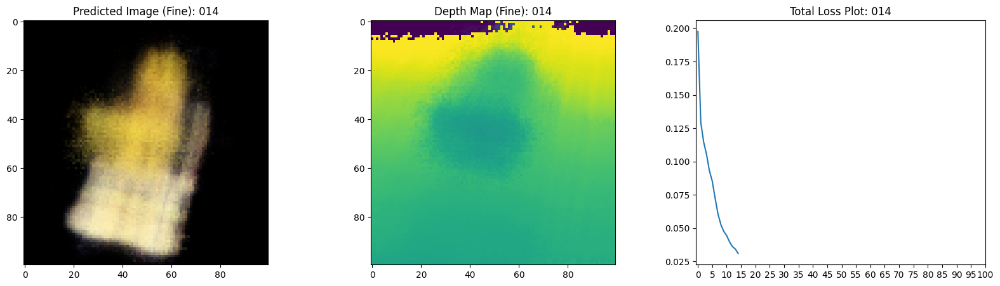

16/16 [==============================] - 12s 729ms/step - loss: 0.0320 - coarse_loss: 0.0160 - fine_loss: 0.0150 - coarse_psnr: 18.1236 - psnr: 18.2577 - val_loss: 0.0300 - val_coarse_loss: 0.0157 - val_fine_loss: 0.0143 - val_coarse_psnr: 18.0989 - val_psnr: 18.5122
Epoch 16/100
16/16 [==============================] - ETA: 0s - loss: 0.0291 - coarse_loss: 0.0150 - fine_loss: 0.0141 - coarse_psnr: 18.3939 - psnr: 18.6703

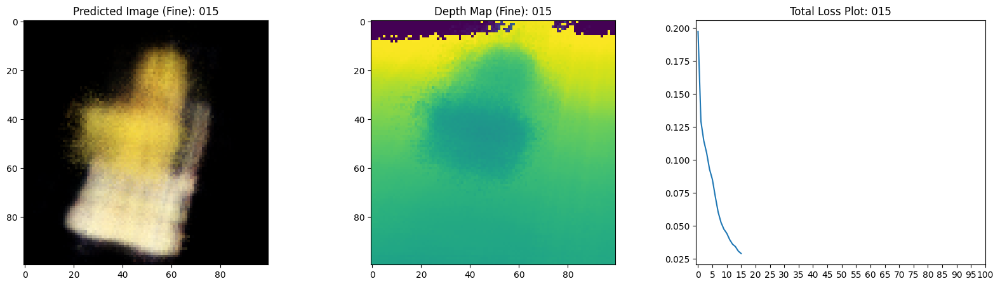

16/16 [==============================] - 12s 728ms/step - loss: 0.0291 - coarse_loss: 0.0150 - fine_loss: 0.0141 - coarse_psnr: 18.3939 - psnr: 18.6686 - val_loss: 0.0288 - val_coarse_loss: 0.0149 - val_fine_loss: 0.0139 - val_coarse_psnr: 18.3360 - val_psnr: 18.6370
Epoch 17/100
16/16 [==============================] - ETA: 0s - loss: 0.0295 - coarse_loss: 0.0154 - fine_loss: 0.0140 - coarse_psnr: 18.2747 - psnr: 18.6051

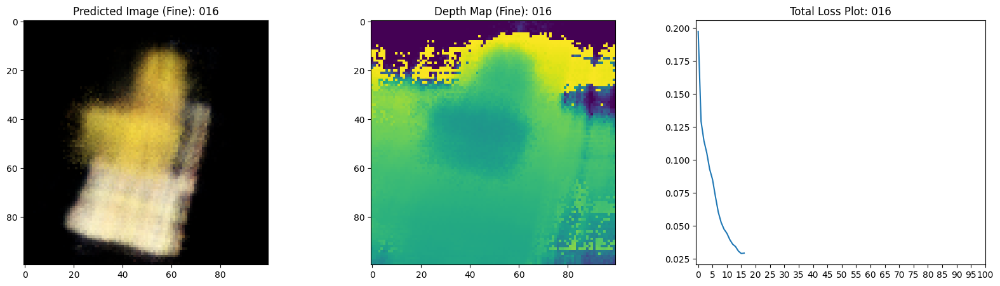

16/16 [==============================] - 12s 727ms/step - loss: 0.0295 - coarse_loss: 0.0154 - fine_loss: 0.0140 - coarse_psnr: 18.2747 - psnr: 18.6082 - val_loss: 0.0281 - val_coarse_loss: 0.0146 - val_fine_loss: 0.0135 - val_coarse_psnr: 18.4277 - val_psnr: 18.7620
Epoch 18/100
16/16 [==============================] - ETA: 0s - loss: 0.0281 - coarse_loss: 0.0147 - fine_loss: 0.0127 - coarse_psnr: 18.5118 - psnr: 18.9971

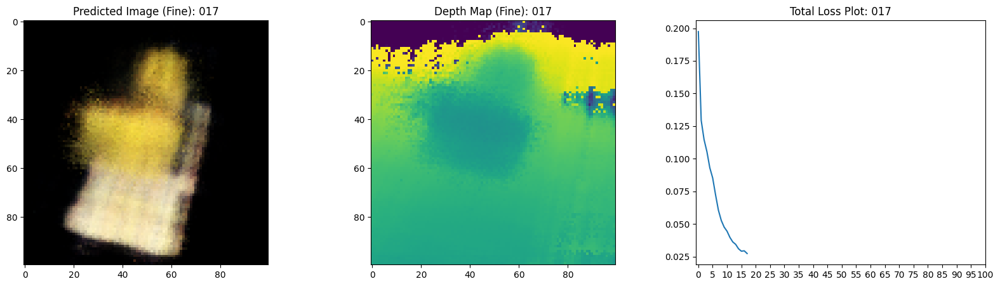

16/16 [==============================] - 12s 728ms/step - loss: 0.0281 - coarse_loss: 0.0147 - fine_loss: 0.0127 - coarse_psnr: 18.5118 - psnr: 19.0035 - val_loss: 0.0271 - val_coarse_loss: 0.0146 - val_fine_loss: 0.0125 - val_coarse_psnr: 18.4453 - val_psnr: 19.1051
Epoch 19/100
16/16 [==============================] - ETA: 0s - loss: 0.0252 - coarse_loss: 0.0133 - fine_loss: 0.0118 - coarse_psnr: 18.8988 - psnr: 19.3706

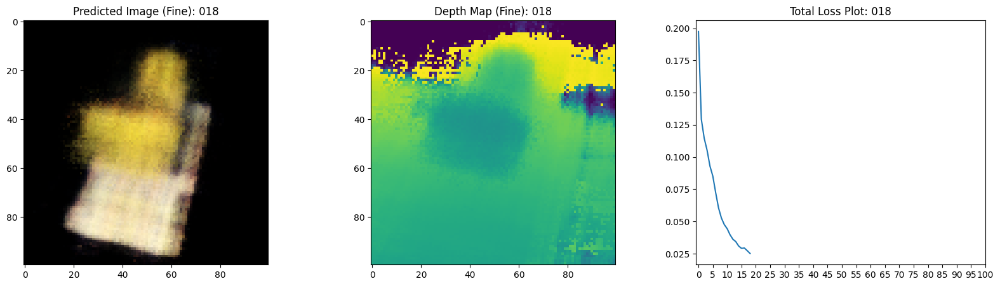

16/16 [==============================] - 12s 727ms/step - loss: 0.0252 - coarse_loss: 0.0133 - fine_loss: 0.0118 - coarse_psnr: 18.8988 - psnr: 19.3724 - val_loss: 0.0252 - val_coarse_loss: 0.0133 - val_fine_loss: 0.0119 - val_coarse_psnr: 18.8226 - val_psnr: 19.3215
Epoch 20/100
16/16 [==============================] - ETA: 0s - loss: 0.0242 - coarse_loss: 0.0129 - fine_loss: 0.0114 - coarse_psnr: 19.0536 - psnr: 19.5685

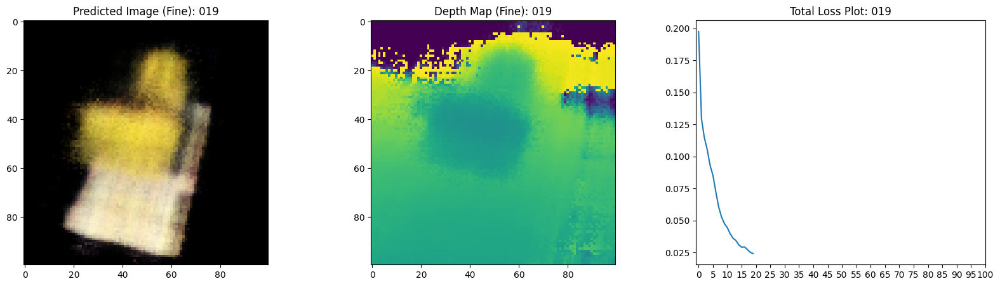

16/16 [==============================] - 12s 742ms/step - loss: 0.0242 - coarse_loss: 0.0129 - fine_loss: 0.0114 - coarse_psnr: 19.0536 - psnr: 19.5688 - val_loss: 0.0245 - val_coarse_loss: 0.0128 - val_fine_loss: 0.0117 - val_coarse_psnr: 18.9655 - val_psnr: 19.3787
Epoch 21/100
16/16 [==============================] - ETA: 0s - loss: 0.0240 - coarse_loss: 0.0128 - fine_loss: 0.0113 - coarse_psnr: 19.0835 - psnr: 19.6065

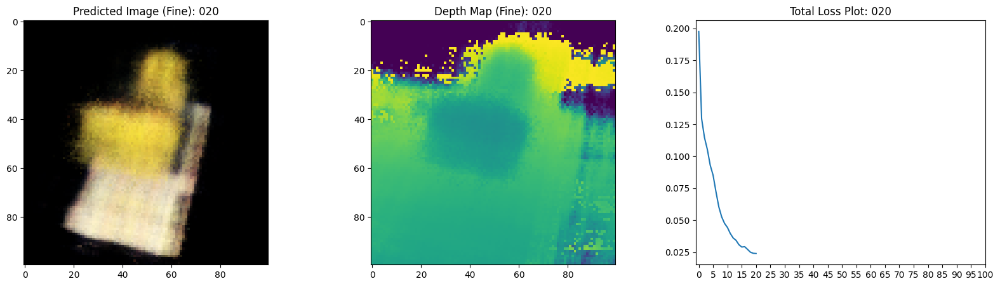

16/16 [==============================] - 12s 728ms/step - loss: 0.0240 - coarse_loss: 0.0128 - fine_loss: 0.0113 - coarse_psnr: 19.0835 - psnr: 19.6057 - val_loss: 0.0234 - val_coarse_loss: 0.0122 - val_fine_loss: 0.0112 - val_coarse_psnr: 19.2367 - val_psnr: 19.5966
Epoch 22/100
16/16 [==============================] - ETA: 0s - loss: 0.0231 - coarse_loss: 0.0120 - fine_loss: 0.0108 - coarse_psnr: 19.3462 - psnr: 19.6955

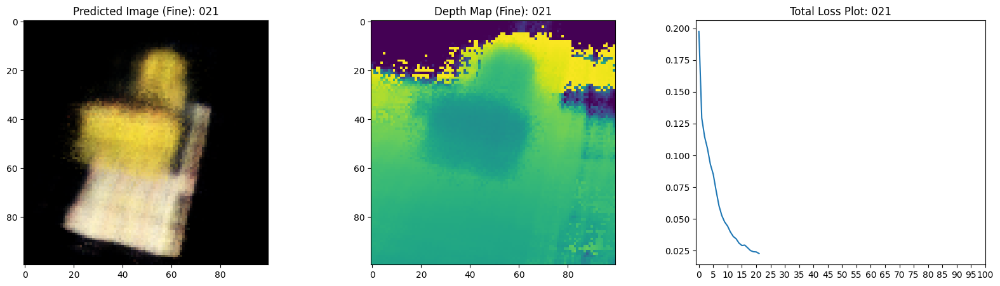

16/16 [==============================] - 12s 726ms/step - loss: 0.0231 - coarse_loss: 0.0120 - fine_loss: 0.0108 - coarse_psnr: 19.3462 - psnr: 19.7017 - val_loss: 0.0224 - val_coarse_loss: 0.0118 - val_fine_loss: 0.0106 - val_coarse_psnr: 19.3703 - val_psnr: 19.8489
Epoch 23/100
16/16 [==============================] - ETA: 0s - loss: 0.0220 - coarse_loss: 0.0118 - fine_loss: 0.0103 - coarse_psnr: 19.4108 - psnr: 19.9816

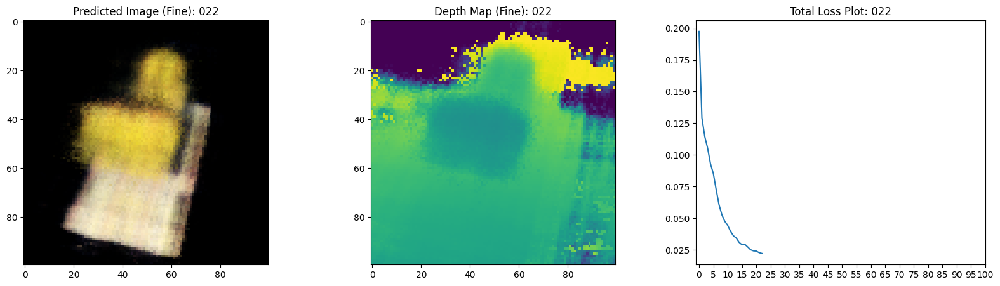

16/16 [==============================] - 12s 727ms/step - loss: 0.0220 - coarse_loss: 0.0118 - fine_loss: 0.0103 - coarse_psnr: 19.4108 - psnr: 19.9811 - val_loss: 0.0217 - val_coarse_loss: 0.0116 - val_fine_loss: 0.0101 - val_coarse_psnr: 19.4487 - val_psnr: 20.0430
Epoch 24/100
16/16 [==============================] - ETA: 0s - loss: 0.0219 - coarse_loss: 0.0116 - fine_loss: 0.0100 - coarse_psnr: 19.4904 - psnr: 20.0448

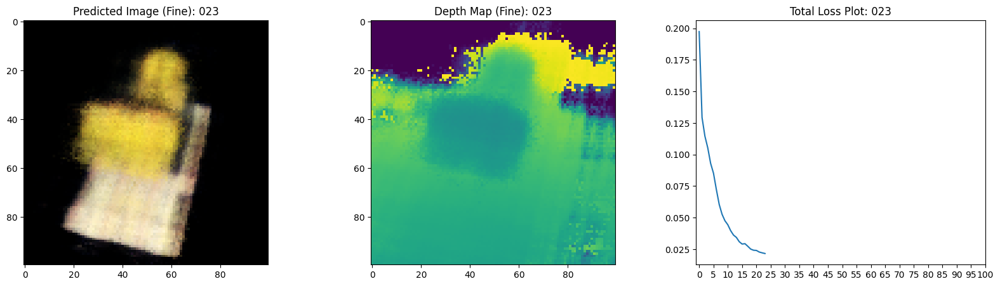

16/16 [==============================] - 12s 727ms/step - loss: 0.0219 - coarse_loss: 0.0116 - fine_loss: 0.0100 - coarse_psnr: 19.4904 - psnr: 20.0490 - val_loss: 0.0215 - val_coarse_loss: 0.0113 - val_fine_loss: 0.0101 - val_coarse_psnr: 19.5306 - val_psnr: 20.0135
Epoch 25/100
16/16 [==============================] - ETA: 0s - loss: 0.0210 - coarse_loss: 0.0110 - fine_loss: 0.0097 - coarse_psnr: 19.7235 - psnr: 20.1743

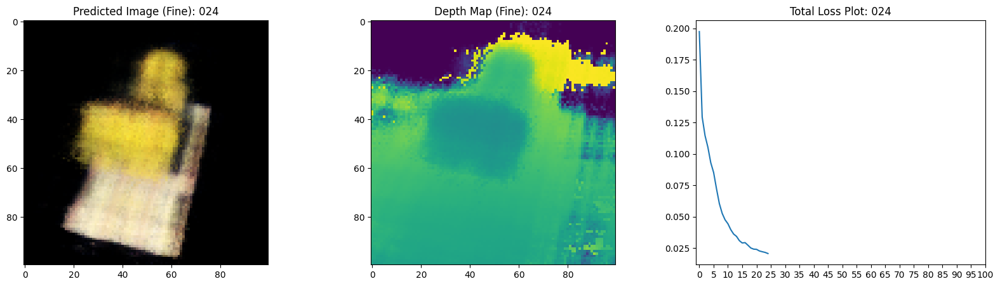

16/16 [==============================] - 12s 727ms/step - loss: 0.0210 - coarse_loss: 0.0110 - fine_loss: 0.0097 - coarse_psnr: 19.7235 - psnr: 20.1794 - val_loss: 0.0207 - val_coarse_loss: 0.0109 - val_fine_loss: 0.0098 - val_coarse_psnr: 19.7504 - val_psnr: 20.1810
Epoch 26/100
16/16 [==============================] - ETA: 0s - loss: 0.0203 - coarse_loss: 0.0108 - fine_loss: 0.0095 - coarse_psnr: 19.8063 - psnr: 20.3122

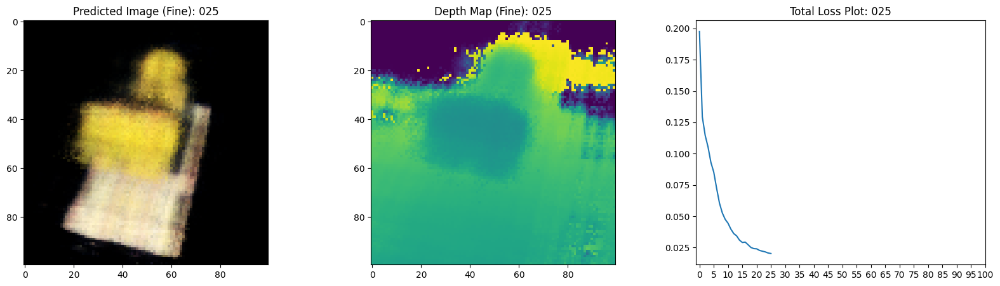

16/16 [==============================] - 12s 726ms/step - loss: 0.0203 - coarse_loss: 0.0108 - fine_loss: 0.0095 - coarse_psnr: 19.8063 - psnr: 20.3139 - val_loss: 0.0203 - val_coarse_loss: 0.0106 - val_fine_loss: 0.0097 - val_coarse_psnr: 19.8627 - val_psnr: 20.2155
Epoch 27/100
16/16 [==============================] - ETA: 0s - loss: 0.0202 - coarse_loss: 0.0107 - fine_loss: 0.0095 - coarse_psnr: 19.8588 - psnr: 20.3139

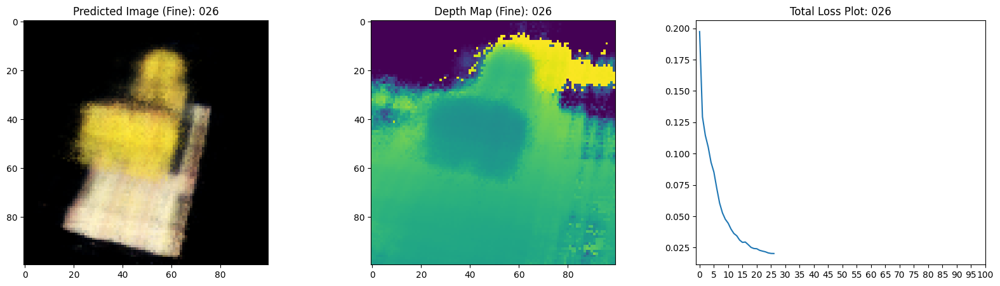

16/16 [==============================] - 12s 727ms/step - loss: 0.0202 - coarse_loss: 0.0107 - fine_loss: 0.0095 - coarse_psnr: 19.8588 - psnr: 20.3160 - val_loss: 0.0202 - val_coarse_loss: 0.0106 - val_fine_loss: 0.0096 - val_coarse_psnr: 19.7986 - val_psnr: 20.2241
Epoch 28/100
16/16 [==============================] - ETA: 0s - loss: 0.0199 - coarse_loss: 0.0105 - fine_loss: 0.0092 - coarse_psnr: 19.9361 - psnr: 20.3963

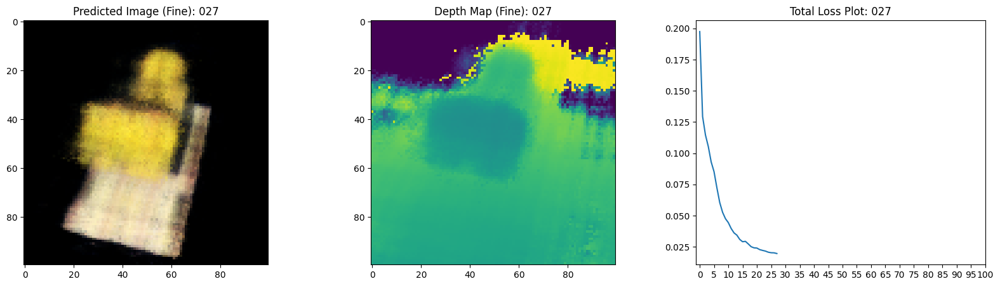

16/16 [==============================] - 12s 741ms/step - loss: 0.0199 - coarse_loss: 0.0105 - fine_loss: 0.0092 - coarse_psnr: 19.9361 - psnr: 20.4025 - val_loss: 0.0190 - val_coarse_loss: 0.0100 - val_fine_loss: 0.0089 - val_coarse_psnr: 20.1132 - val_psnr: 20.6070
Epoch 29/100
16/16 [==============================] - ETA: 0s - loss: 0.0190 - coarse_loss: 0.0101 - fine_loss: 0.0089 - coarse_psnr: 20.1241 - psnr: 20.5985

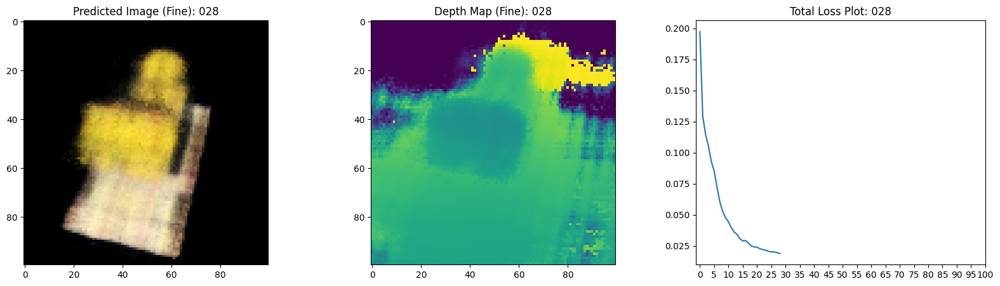

16/16 [==============================] - 12s 726ms/step - loss: 0.0190 - coarse_loss: 0.0101 - fine_loss: 0.0089 - coarse_psnr: 20.1241 - psnr: 20.6015 - val_loss: 0.0177 - val_coarse_loss: 0.0094 - val_fine_loss: 0.0083 - val_coarse_psnr: 20.3789 - val_psnr: 20.9068
Epoch 30/100
16/16 [==============================] - ETA: 0s - loss: 0.0184 - coarse_loss: 0.0097 - fine_loss: 0.0086 - coarse_psnr: 20.2826 - psnr: 20.7379

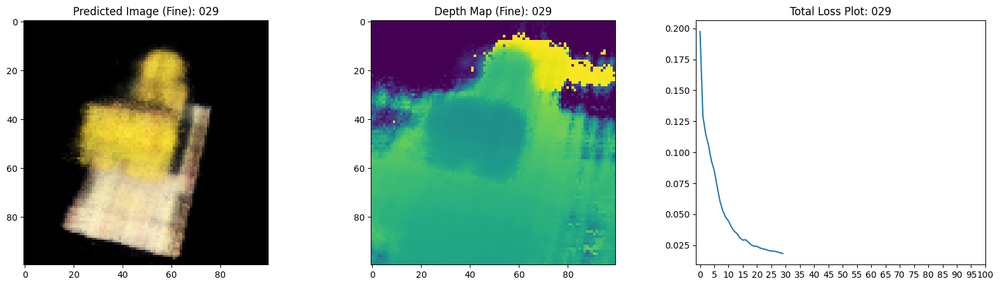

16/16 [==============================] - 12s 726ms/step - loss: 0.0184 - coarse_loss: 0.0097 - fine_loss: 0.0086 - coarse_psnr: 20.2826 - psnr: 20.7404 - val_loss: 0.0182 - val_coarse_loss: 0.0096 - val_fine_loss: 0.0086 - val_coarse_psnr: 20.3086 - val_psnr: 20.7648
Epoch 31/100
16/16 [==============================] - ETA: 0s - loss: 0.0181 - coarse_loss: 0.0097 - fine_loss: 0.0085 - coarse_psnr: 20.2993 - psnr: 20.7910

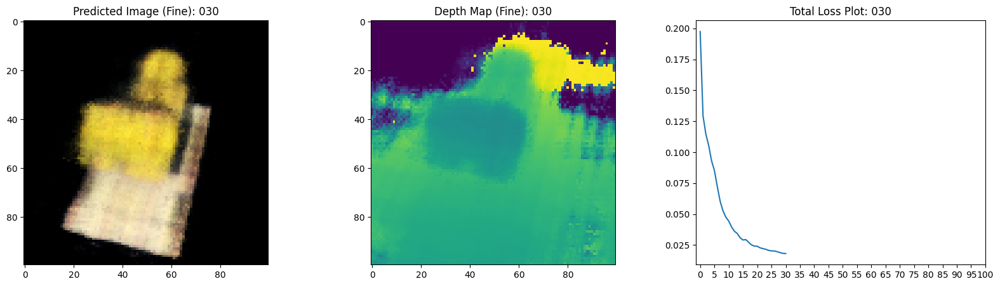

16/16 [==============================] - 12s 727ms/step - loss: 0.0181 - coarse_loss: 0.0097 - fine_loss: 0.0085 - coarse_psnr: 20.2993 - psnr: 20.7922 - val_loss: 0.0180 - val_coarse_loss: 0.0094 - val_fine_loss: 0.0085 - val_coarse_psnr: 20.3457 - val_psnr: 20.8046
Epoch 32/100
16/16 [==============================] - ETA: 0s - loss: 0.0180 - coarse_loss: 0.0094 - fine_loss: 0.0084 - coarse_psnr: 20.4077 - psnr: 20.8426

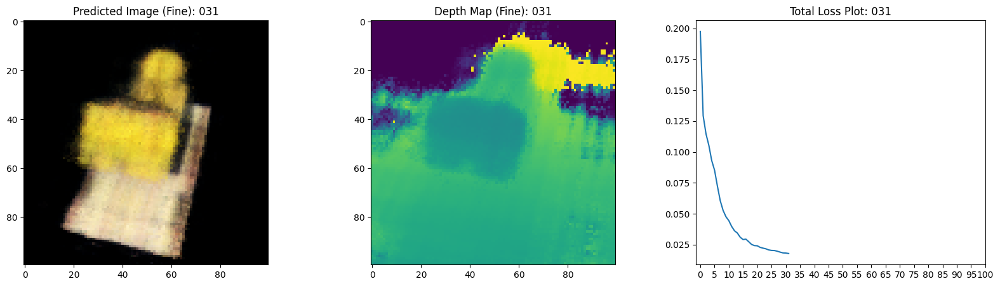

16/16 [==============================] - 12s 728ms/step - loss: 0.0179 - coarse_loss: 0.0094 - fine_loss: 0.0084 - coarse_psnr: 20.4077 - psnr: 20.8451 - val_loss: 0.0172 - val_coarse_loss: 0.0090 - val_fine_loss: 0.0082 - val_coarse_psnr: 20.5785 - val_psnr: 20.9650
Epoch 33/100
16/16 [==============================] - ETA: 0s - loss: 0.0174 - coarse_loss: 0.0091 - fine_loss: 0.0081 - coarse_psnr: 20.5690 - psnr: 20.9660

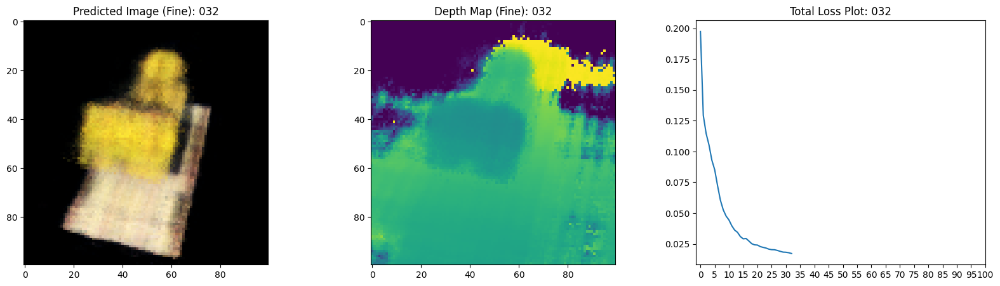

16/16 [==============================] - 12s 727ms/step - loss: 0.0174 - coarse_loss: 0.0091 - fine_loss: 0.0081 - coarse_psnr: 20.5690 - psnr: 20.9720 - val_loss: 0.0170 - val_coarse_loss: 0.0089 - val_fine_loss: 0.0081 - val_coarse_psnr: 20.6745 - val_psnr: 21.0734
Epoch 34/100
16/16 [==============================] - ETA: 0s - loss: 0.0168 - coarse_loss: 0.0089 - fine_loss: 0.0081 - coarse_psnr: 20.6636 - psnr: 21.0783

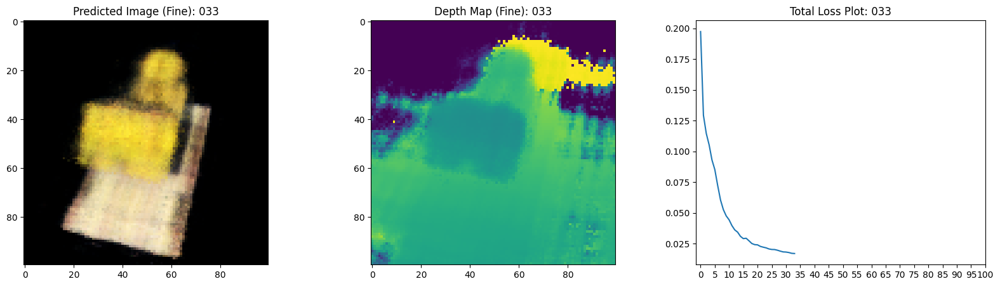

16/16 [==============================] - 12s 726ms/step - loss: 0.0168 - coarse_loss: 0.0089 - fine_loss: 0.0081 - coarse_psnr: 20.6636 - psnr: 21.0777 - val_loss: 0.0168 - val_coarse_loss: 0.0086 - val_fine_loss: 0.0082 - val_coarse_psnr: 20.7502 - val_psnr: 20.9702
Epoch 35/100
16/16 [==============================] - ETA: 0s - loss: 0.0170 - coarse_loss: 0.0088 - fine_loss: 0.0080 - coarse_psnr: 20.6849 - psnr: 20.9851

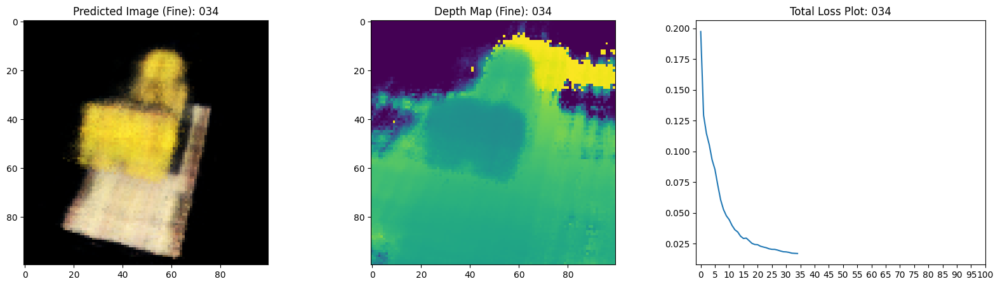

16/16 [==============================] - 12s 725ms/step - loss: 0.0170 - coarse_loss: 0.0088 - fine_loss: 0.0080 - coarse_psnr: 20.6849 - psnr: 20.9913 - val_loss: 0.0166 - val_coarse_loss: 0.0086 - val_fine_loss: 0.0080 - val_coarse_psnr: 20.7499 - val_psnr: 21.0667
Epoch 36/100
16/16 [==============================] - ETA: 0s - loss: 0.0166 - coarse_loss: 0.0087 - fine_loss: 0.0079 - coarse_psnr: 20.7709 - psnr: 21.1000

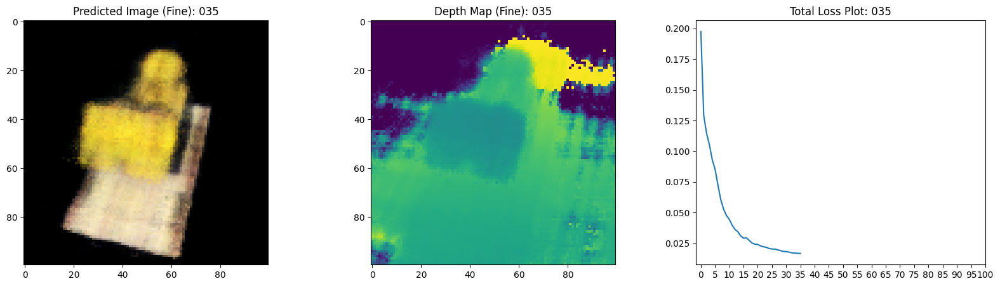

16/16 [==============================] - 12s 726ms/step - loss: 0.0166 - coarse_loss: 0.0087 - fine_loss: 0.0079 - coarse_psnr: 20.7709 - psnr: 21.1021 - val_loss: 0.0162 - val_coarse_loss: 0.0083 - val_fine_loss: 0.0078 - val_coarse_psnr: 20.9213 - val_psnr: 21.1690
Epoch 37/100
16/16 [==============================] - ETA: 0s - loss: 0.0167 - coarse_loss: 0.0087 - fine_loss: 0.0079 - coarse_psnr: 20.7544 - psnr: 21.1055

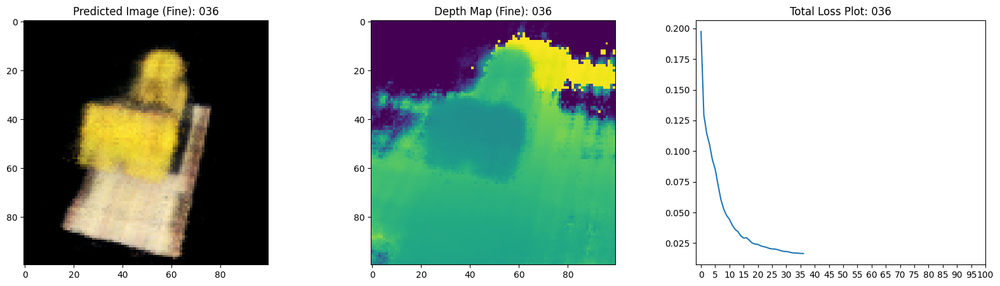

16/16 [==============================] - 12s 726ms/step - loss: 0.0167 - coarse_loss: 0.0087 - fine_loss: 0.0079 - coarse_psnr: 20.7544 - psnr: 21.1102 - val_loss: 0.0163 - val_coarse_loss: 0.0084 - val_fine_loss: 0.0079 - val_coarse_psnr: 20.9084 - val_psnr: 21.1330
Epoch 38/100
16/16 [==============================] - ETA: 0s - loss: 0.0164 - coarse_loss: 0.0083 - fine_loss: 0.0076 - coarse_psnr: 20.9835 - psnr: 21.1337

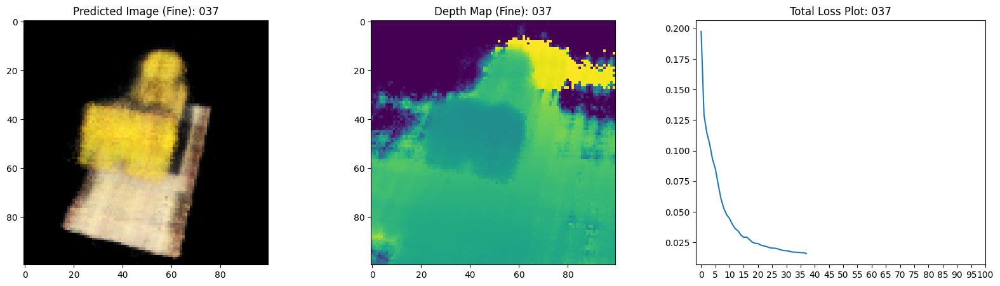

16/16 [==============================] - 12s 743ms/step - loss: 0.0164 - coarse_loss: 0.0083 - fine_loss: 0.0076 - coarse_psnr: 20.9835 - psnr: 21.1448 - val_loss: 0.0159 - val_coarse_loss: 0.0082 - val_fine_loss: 0.0076 - val_coarse_psnr: 21.0063 - val_psnr: 21.2895
Epoch 39/100
16/16 [==============================] - ETA: 0s - loss: 0.0161 - coarse_loss: 0.0082 - fine_loss: 0.0075 - coarse_psnr: 21.0321 - psnr: 21.2230

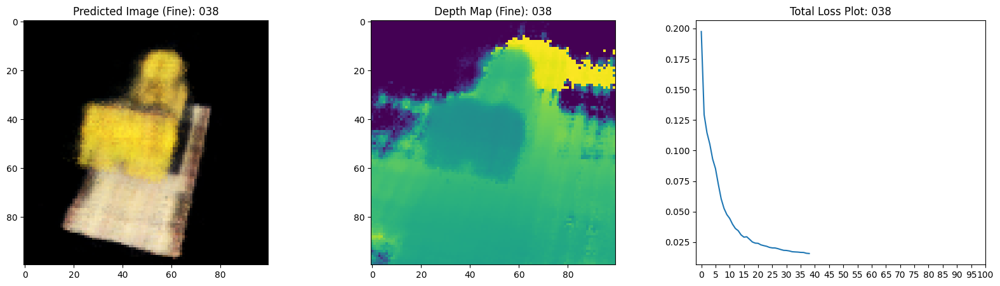

16/16 [==============================] - 12s 725ms/step - loss: 0.0161 - coarse_loss: 0.0082 - fine_loss: 0.0075 - coarse_psnr: 21.0321 - psnr: 21.2328 - val_loss: 0.0156 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0075 - val_coarse_psnr: 21.0769 - val_psnr: 21.3368
Epoch 40/100
16/16 [==============================] - ETA: 0s - loss: 0.0156 - coarse_loss: 0.0080 - fine_loss: 0.0073 - coarse_psnr: 21.1213 - psnr: 21.3808

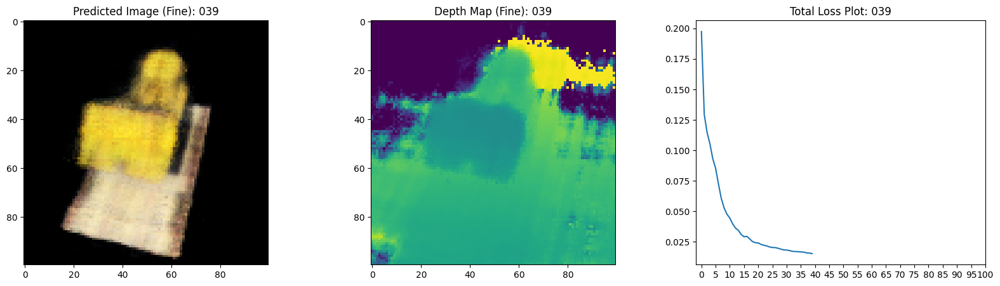

16/16 [==============================] - 12s 726ms/step - loss: 0.0156 - coarse_loss: 0.0080 - fine_loss: 0.0073 - coarse_psnr: 21.1213 - psnr: 21.3869 - val_loss: 0.0156 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0075 - val_coarse_psnr: 21.0510 - val_psnr: 21.3443
Epoch 41/100
16/16 [==============================] - ETA: 0s - loss: 0.0155 - coarse_loss: 0.0080 - fine_loss: 0.0074 - coarse_psnr: 21.0813 - psnr: 21.3974

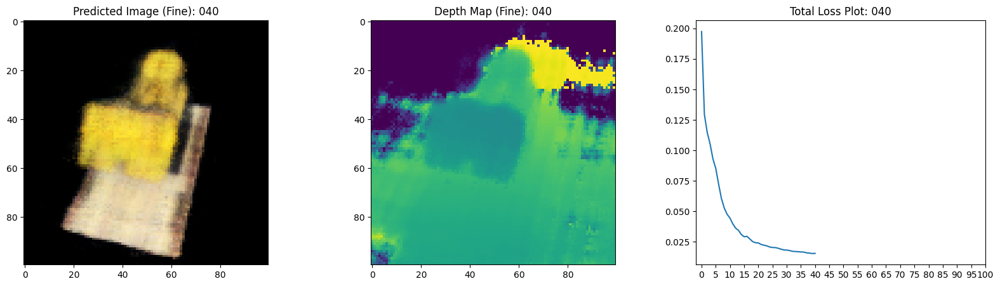

16/16 [==============================] - 12s 725ms/step - loss: 0.0155 - coarse_loss: 0.0080 - fine_loss: 0.0074 - coarse_psnr: 21.0813 - psnr: 21.3993 - val_loss: 0.0156 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0075 - val_coarse_psnr: 21.0542 - val_psnr: 21.3403
Epoch 42/100
16/16 [==============================] - ETA: 0s - loss: 0.0153 - coarse_loss: 0.0078 - fine_loss: 0.0073 - coarse_psnr: 21.2144 - psnr: 21.4305

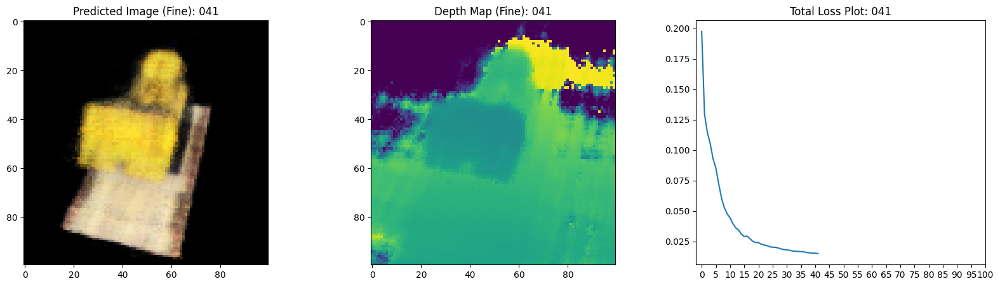

16/16 [==============================] - 12s 726ms/step - loss: 0.0153 - coarse_loss: 0.0078 - fine_loss: 0.0073 - coarse_psnr: 21.2144 - psnr: 21.4352 - val_loss: 0.0152 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0075 - val_coarse_psnr: 21.1735 - val_psnr: 21.3470
Epoch 43/100
16/16 [==============================] - ETA: 0s - loss: 0.0150 - coarse_loss: 0.0077 - fine_loss: 0.0072 - coarse_psnr: 21.3079 - psnr: 21.5004

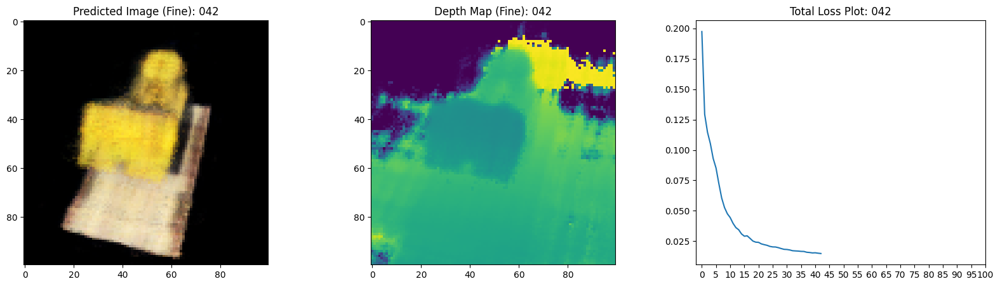

16/16 [==============================] - 12s 726ms/step - loss: 0.0150 - coarse_loss: 0.0077 - fine_loss: 0.0072 - coarse_psnr: 21.3079 - psnr: 21.5047 - val_loss: 0.0146 - val_coarse_loss: 0.0073 - val_fine_loss: 0.0073 - val_coarse_psnr: 21.4732 - val_psnr: 21.4367
Epoch 44/100
16/16 [==============================] - ETA: 0s - loss: 0.0150 - coarse_loss: 0.0076 - fine_loss: 0.0072 - coarse_psnr: 21.2969 - psnr: 21.4609

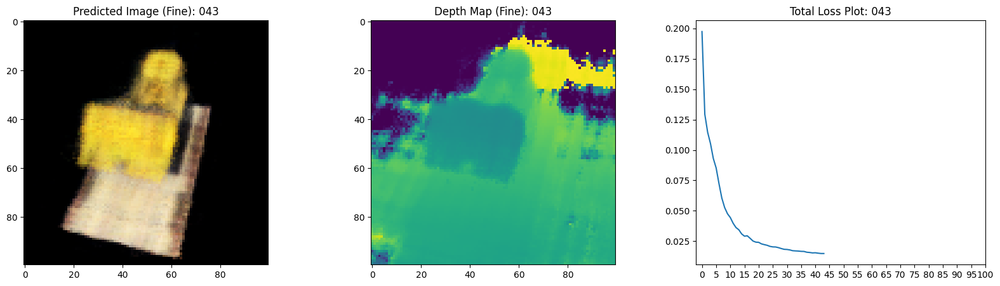

16/16 [==============================] - 12s 726ms/step - loss: 0.0150 - coarse_loss: 0.0076 - fine_loss: 0.0072 - coarse_psnr: 21.2969 - psnr: 21.4658 - val_loss: 0.0148 - val_coarse_loss: 0.0075 - val_fine_loss: 0.0073 - val_coarse_psnr: 21.3018 - val_psnr: 21.4618
Epoch 45/100
16/16 [==============================] - ETA: 0s - loss: 0.0145 - coarse_loss: 0.0074 - fine_loss: 0.0070 - coarse_psnr: 21.4178 - psnr: 21.6606

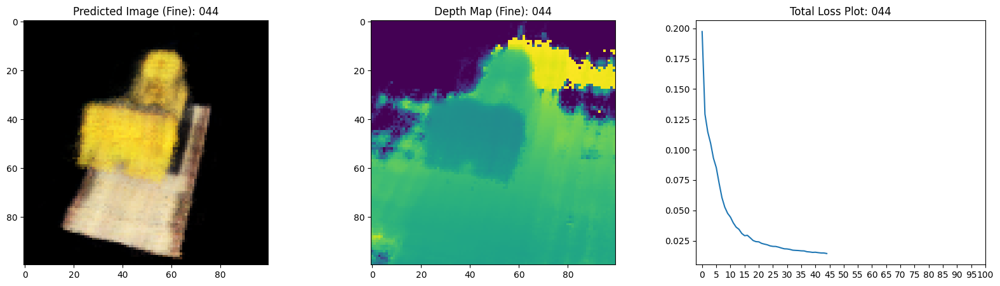

16/16 [==============================] - 12s 726ms/step - loss: 0.0145 - coarse_loss: 0.0074 - fine_loss: 0.0070 - coarse_psnr: 21.4178 - psnr: 21.6634 - val_loss: 0.0145 - val_coarse_loss: 0.0074 - val_fine_loss: 0.0071 - val_coarse_psnr: 21.4355 - val_psnr: 21.5809
Epoch 46/100
16/16 [==============================] - ETA: 0s - loss: 0.0146 - coarse_loss: 0.0075 - fine_loss: 0.0070 - coarse_psnr: 21.3897 - psnr: 21.6327

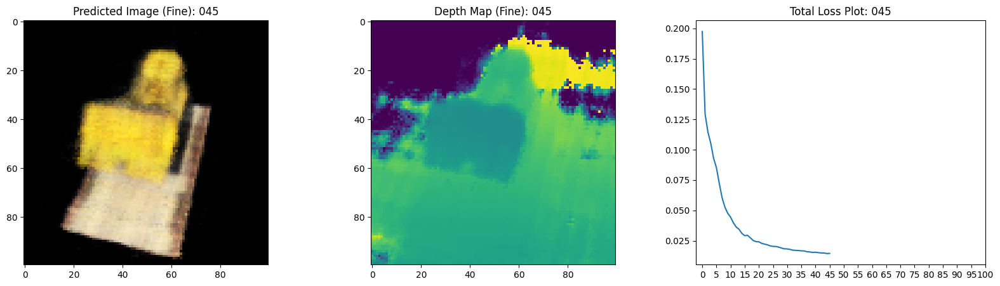

16/16 [==============================] - 12s 726ms/step - loss: 0.0146 - coarse_loss: 0.0075 - fine_loss: 0.0070 - coarse_psnr: 21.3897 - psnr: 21.6353 - val_loss: 0.0149 - val_coarse_loss: 0.0075 - val_fine_loss: 0.0074 - val_coarse_psnr: 21.3201 - val_psnr: 21.4095
Epoch 47/100
16/16 [==============================] - ETA: 0s - loss: 0.0150 - coarse_loss: 0.0077 - fine_loss: 0.0072 - coarse_psnr: 21.2986 - psnr: 21.4991

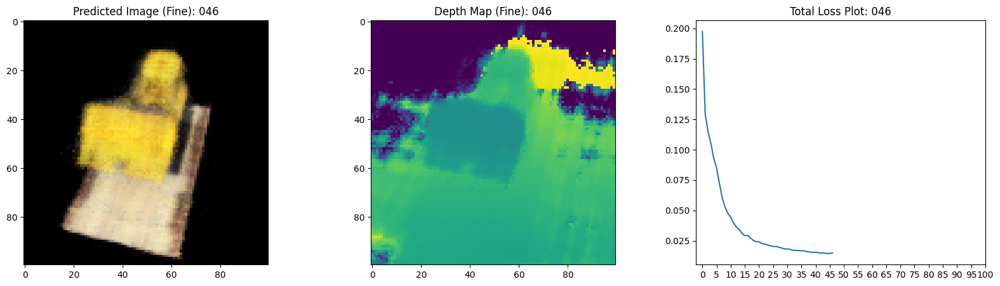

16/16 [==============================] - 12s 742ms/step - loss: 0.0150 - coarse_loss: 0.0077 - fine_loss: 0.0072 - coarse_psnr: 21.2986 - psnr: 21.5045 - val_loss: 0.0143 - val_coarse_loss: 0.0072 - val_fine_loss: 0.0071 - val_coarse_psnr: 21.4710 - val_psnr: 21.5815
Epoch 48/100
16/16 [==============================] - ETA: 0s - loss: 0.0145 - coarse_loss: 0.0073 - fine_loss: 0.0068 - coarse_psnr: 21.4968 - psnr: 21.6812

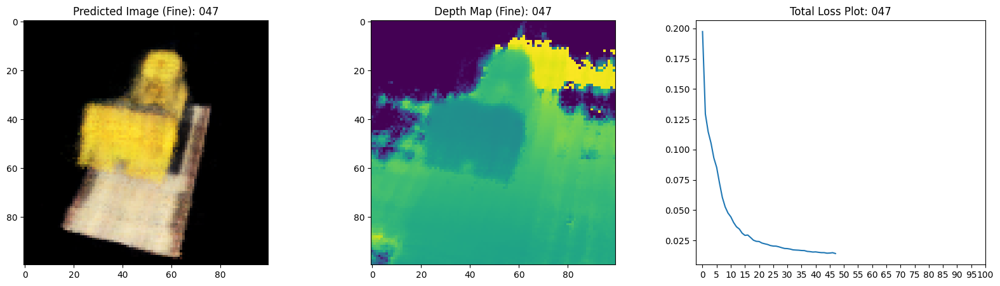

16/16 [==============================] - 12s 728ms/step - loss: 0.0145 - coarse_loss: 0.0073 - fine_loss: 0.0068 - coarse_psnr: 21.4968 - psnr: 21.6900 - val_loss: 0.0138 - val_coarse_loss: 0.0070 - val_fine_loss: 0.0068 - val_coarse_psnr: 21.6802 - val_psnr: 21.7899
Epoch 49/100
16/16 [==============================] - ETA: 0s - loss: 0.0141 - coarse_loss: 0.0072 - fine_loss: 0.0067 - coarse_psnr: 21.5779 - psnr: 21.8122

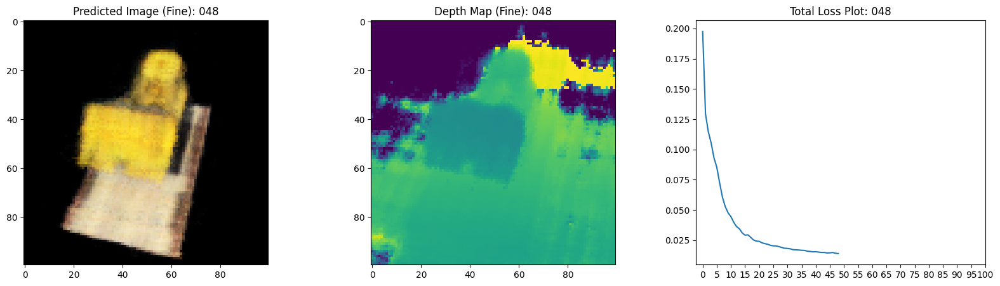

16/16 [==============================] - 12s 725ms/step - loss: 0.0141 - coarse_loss: 0.0072 - fine_loss: 0.0067 - coarse_psnr: 21.5779 - psnr: 21.8158 - val_loss: 0.0141 - val_coarse_loss: 0.0071 - val_fine_loss: 0.0070 - val_coarse_psnr: 21.5929 - val_psnr: 21.6317
Epoch 50/100
16/16 [==============================] - ETA: 0s - loss: 0.0141 - coarse_loss: 0.0071 - fine_loss: 0.0067 - coarse_psnr: 21.6312 - psnr: 21.7499

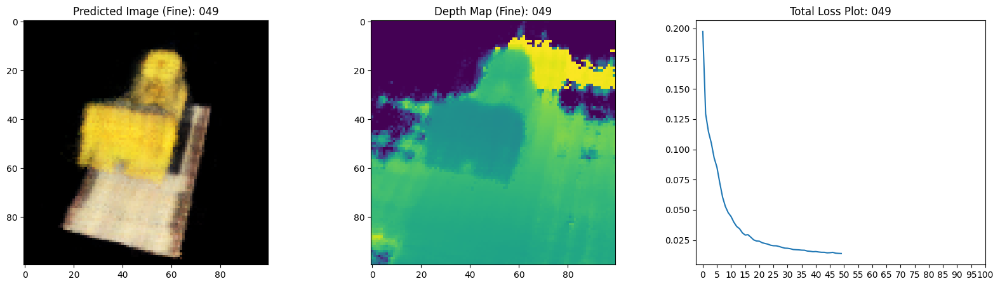

16/16 [==============================] - 12s 726ms/step - loss: 0.0141 - coarse_loss: 0.0071 - fine_loss: 0.0067 - coarse_psnr: 21.6312 - psnr: 21.7564 - val_loss: 0.0130 - val_coarse_loss: 0.0066 - val_fine_loss: 0.0064 - val_coarse_psnr: 21.9588 - val_psnr: 22.0303
Epoch 51/100
16/16 [==============================] - ETA: 0s - loss: 0.0135 - coarse_loss: 0.0069 - fine_loss: 0.0065 - coarse_psnr: 21.7446 - psnr: 21.9508

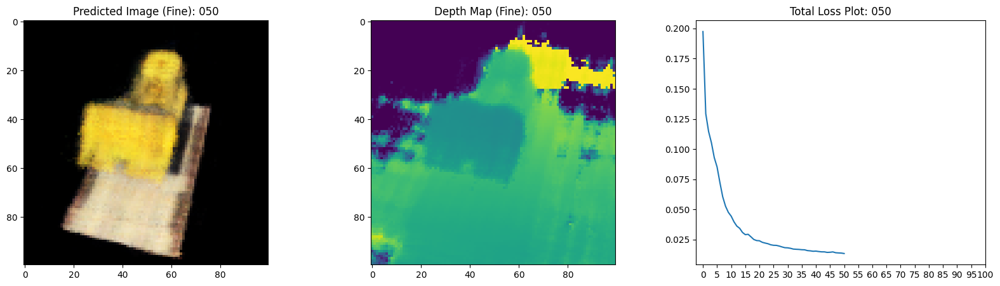

16/16 [==============================] - 12s 725ms/step - loss: 0.0135 - coarse_loss: 0.0069 - fine_loss: 0.0065 - coarse_psnr: 21.7446 - psnr: 21.9530 - val_loss: 0.0131 - val_coarse_loss: 0.0065 - val_fine_loss: 0.0066 - val_coarse_psnr: 21.9687 - val_psnr: 21.9319
Epoch 52/100
16/16 [==============================] - ETA: 0s - loss: 0.0137 - coarse_loss: 0.0068 - fine_loss: 0.0065 - coarse_psnr: 21.7958 - psnr: 21.8432

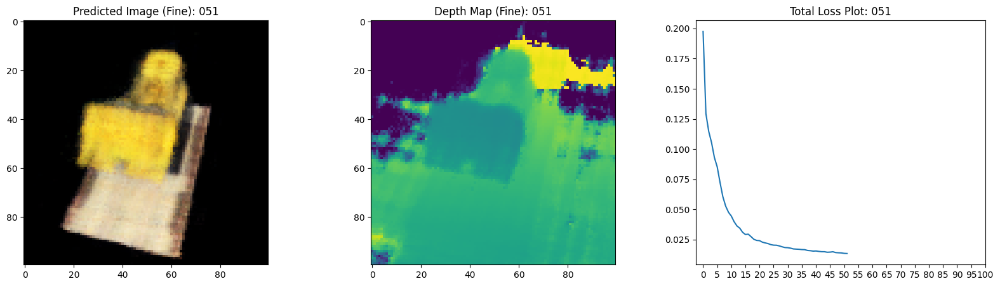

16/16 [==============================] - 12s 726ms/step - loss: 0.0137 - coarse_loss: 0.0068 - fine_loss: 0.0065 - coarse_psnr: 21.7958 - psnr: 21.8524 - val_loss: 0.0134 - val_coarse_loss: 0.0068 - val_fine_loss: 0.0066 - val_coarse_psnr: 21.7861 - val_psnr: 21.8850
Epoch 53/100
16/16 [==============================] - ETA: 0s - loss: 0.0134 - coarse_loss: 0.0068 - fine_loss: 0.0064 - coarse_psnr: 21.8118 - psnr: 21.9728

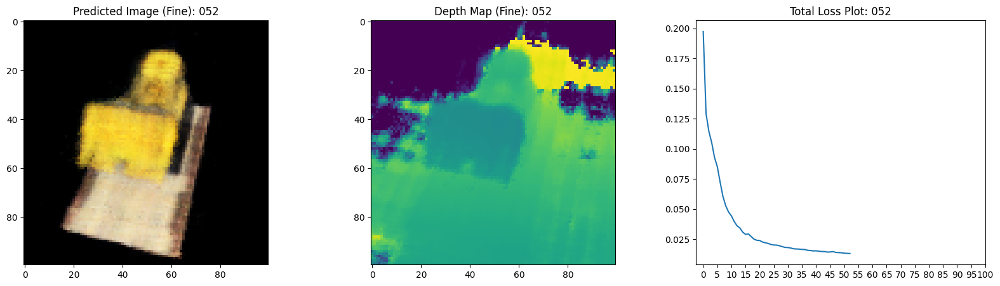

16/16 [==============================] - 12s 726ms/step - loss: 0.0134 - coarse_loss: 0.0068 - fine_loss: 0.0064 - coarse_psnr: 21.8118 - psnr: 21.9785 - val_loss: 0.0131 - val_coarse_loss: 0.0066 - val_fine_loss: 0.0065 - val_coarse_psnr: 21.9229 - val_psnr: 22.0077
Epoch 54/100
16/16 [==============================] - ETA: 0s - loss: 0.0132 - coarse_loss: 0.0068 - fine_loss: 0.0064 - coarse_psnr: 21.8458 - psnr: 22.0543

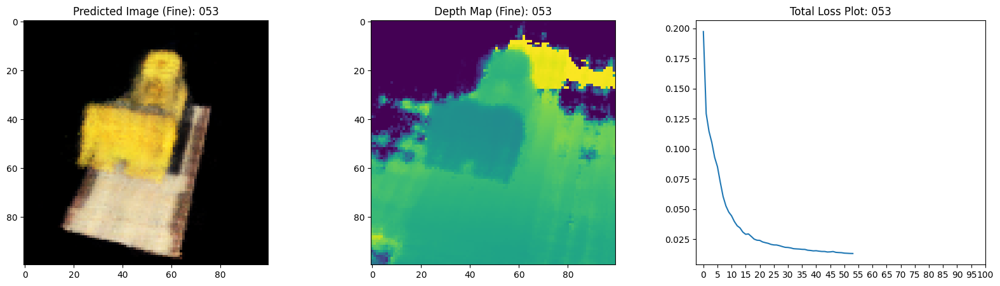

16/16 [==============================] - 12s 726ms/step - loss: 0.0132 - coarse_loss: 0.0068 - fine_loss: 0.0064 - coarse_psnr: 21.8458 - psnr: 22.0560 - val_loss: 0.0128 - val_coarse_loss: 0.0065 - val_fine_loss: 0.0063 - val_coarse_psnr: 21.9785 - val_psnr: 22.1423
Epoch 55/100
16/16 [==============================] - ETA: 0s - loss: 0.0132 - coarse_loss: 0.0068 - fine_loss: 0.0064 - coarse_psnr: 21.8144 - psnr: 22.0623

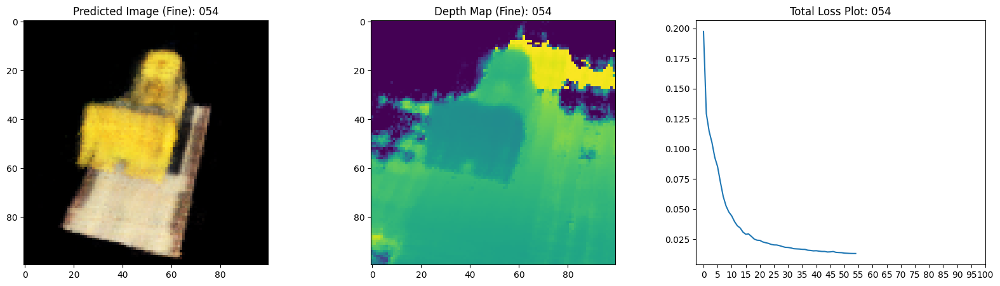

16/16 [==============================] - 12s 726ms/step - loss: 0.0132 - coarse_loss: 0.0068 - fine_loss: 0.0064 - coarse_psnr: 21.8144 - psnr: 22.0643 - val_loss: 0.0132 - val_coarse_loss: 0.0067 - val_fine_loss: 0.0065 - val_coarse_psnr: 21.8060 - val_psnr: 21.9713
Epoch 56/100
16/16 [==============================] - ETA: 0s - loss: 0.0133 - coarse_loss: 0.0068 - fine_loss: 0.0064 - coarse_psnr: 21.8296 - psnr: 22.0468

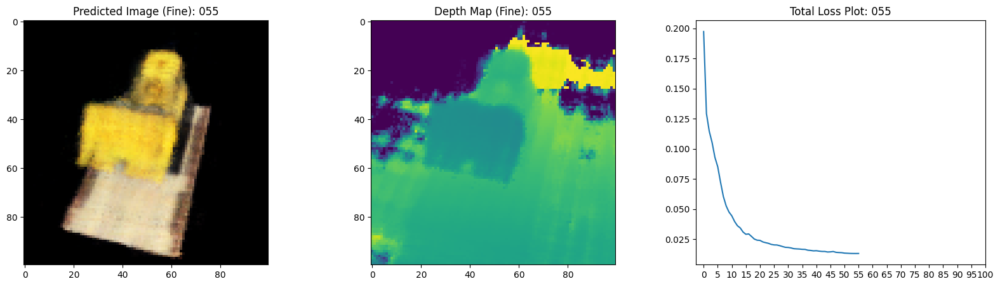

16/16 [==============================] - 12s 726ms/step - loss: 0.0132 - coarse_loss: 0.0068 - fine_loss: 0.0064 - coarse_psnr: 21.8296 - psnr: 22.0487 - val_loss: 0.0132 - val_coarse_loss: 0.0067 - val_fine_loss: 0.0064 - val_coarse_psnr: 21.7857 - val_psnr: 22.0287
Epoch 57/100
16/16 [==============================] - ETA: 0s - loss: 0.0130 - coarse_loss: 0.0067 - fine_loss: 0.0063 - coarse_psnr: 21.8805 - psnr: 22.1233

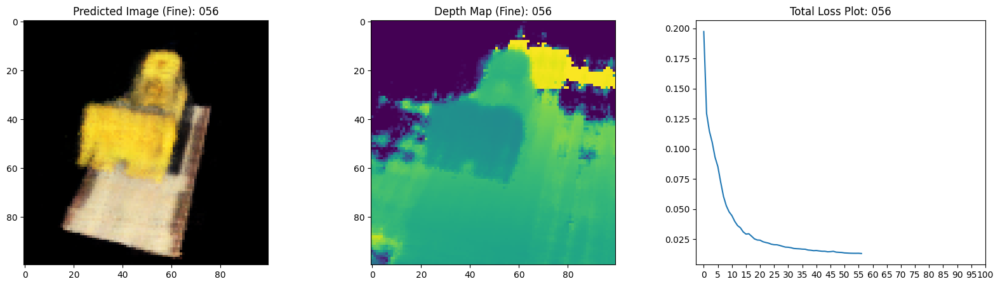

16/16 [==============================] - 12s 742ms/step - loss: 0.0130 - coarse_loss: 0.0067 - fine_loss: 0.0063 - coarse_psnr: 21.8805 - psnr: 22.1242 - val_loss: 0.0125 - val_coarse_loss: 0.0064 - val_fine_loss: 0.0062 - val_coarse_psnr: 22.0502 - val_psnr: 22.2214
Epoch 58/100
16/16 [==============================] - ETA: 0s - loss: 0.0129 - coarse_loss: 0.0065 - fine_loss: 0.0061 - coarse_psnr: 22.0125 - psnr: 22.1540

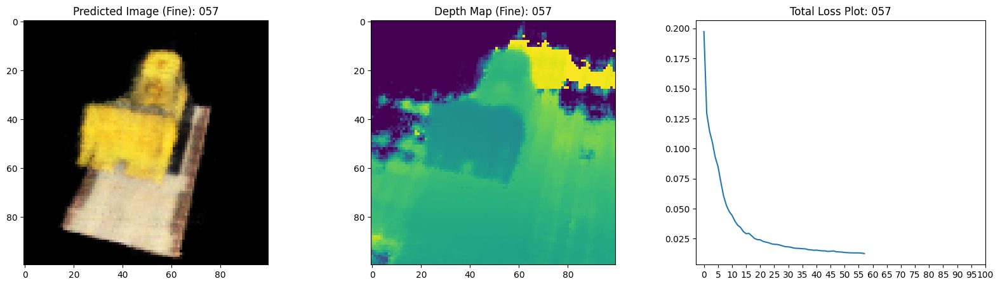

16/16 [==============================] - 12s 725ms/step - loss: 0.0129 - coarse_loss: 0.0065 - fine_loss: 0.0061 - coarse_psnr: 22.0125 - psnr: 22.1602 - val_loss: 0.0129 - val_coarse_loss: 0.0066 - val_fine_loss: 0.0063 - val_coarse_psnr: 21.8696 - val_psnr: 22.0983
Epoch 59/100
16/16 [==============================] - ETA: 0s - loss: 0.0130 - coarse_loss: 0.0066 - fine_loss: 0.0062 - coarse_psnr: 21.9147 - psnr: 22.1269

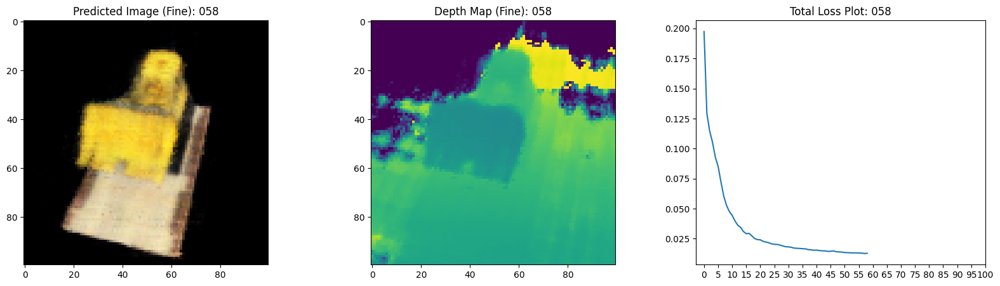

16/16 [==============================] - 12s 726ms/step - loss: 0.0130 - coarse_loss: 0.0066 - fine_loss: 0.0062 - coarse_psnr: 21.9147 - psnr: 22.1316 - val_loss: 0.0131 - val_coarse_loss: 0.0067 - val_fine_loss: 0.0064 - val_coarse_psnr: 21.8066 - val_psnr: 22.0302
Epoch 60/100
16/16 [==============================] - ETA: 0s - loss: 0.0132 - coarse_loss: 0.0065 - fine_loss: 0.0062 - coarse_psnr: 21.9814 - psnr: 22.0976

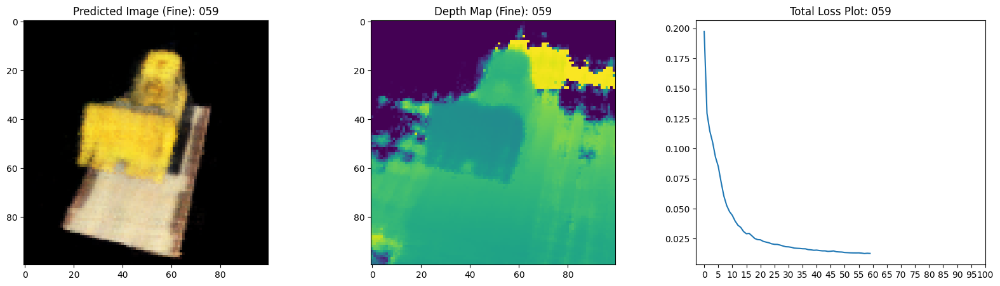

16/16 [==============================] - 12s 725ms/step - loss: 0.0132 - coarse_loss: 0.0065 - fine_loss: 0.0062 - coarse_psnr: 21.9814 - psnr: 22.1059 - val_loss: 0.0128 - val_coarse_loss: 0.0064 - val_fine_loss: 0.0064 - val_coarse_psnr: 21.9934 - val_psnr: 22.0288
Epoch 61/100
16/16 [==============================] - ETA: 0s - loss: 0.0127 - coarse_loss: 0.0064 - fine_loss: 0.0061 - coarse_psnr: 22.0656 - psnr: 22.2168

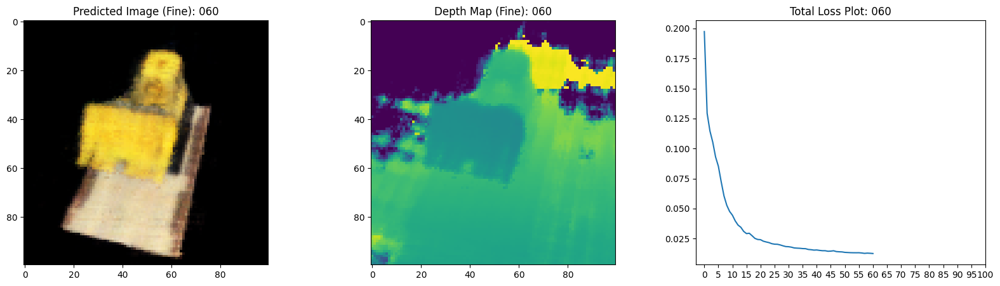

16/16 [==============================] - 11s 724ms/step - loss: 0.0127 - coarse_loss: 0.0064 - fine_loss: 0.0061 - coarse_psnr: 22.0656 - psnr: 22.2208 - val_loss: 0.0127 - val_coarse_loss: 0.0064 - val_fine_loss: 0.0063 - val_coarse_psnr: 22.0520 - val_psnr: 22.0846
Epoch 62/100
16/16 [==============================] - ETA: 0s - loss: 0.0126 - coarse_loss: 0.0063 - fine_loss: 0.0061 - coarse_psnr: 22.1051 - psnr: 22.2271

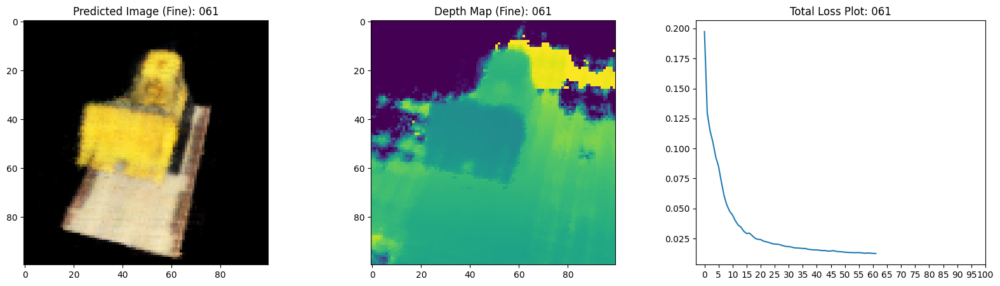

16/16 [==============================] - 12s 725ms/step - loss: 0.0126 - coarse_loss: 0.0063 - fine_loss: 0.0061 - coarse_psnr: 22.1051 - psnr: 22.2317 - val_loss: 0.0130 - val_coarse_loss: 0.0063 - val_fine_loss: 0.0066 - val_coarse_psnr: 22.0521 - val_psnr: 21.8723
Epoch 63/100
16/16 [==============================] - ETA: 0s - loss: 0.0128 - coarse_loss: 0.0064 - fine_loss: 0.0062 - coarse_psnr: 22.0569 - psnr: 22.1166

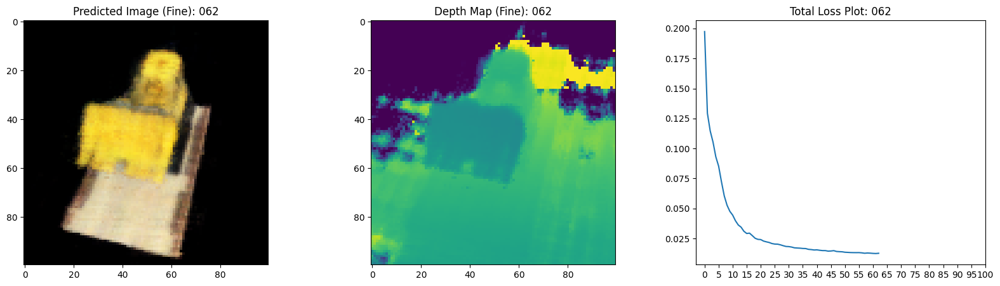

16/16 [==============================] - 11s 724ms/step - loss: 0.0128 - coarse_loss: 0.0064 - fine_loss: 0.0062 - coarse_psnr: 22.0569 - psnr: 22.1218 - val_loss: 0.0124 - val_coarse_loss: 0.0062 - val_fine_loss: 0.0062 - val_coarse_psnr: 22.1586 - val_psnr: 22.1123
Epoch 64/100
16/16 [==============================] - ETA: 0s - loss: 0.0125 - coarse_loss: 0.0064 - fine_loss: 0.0060 - coarse_psnr: 22.1074 - psnr: 22.2439

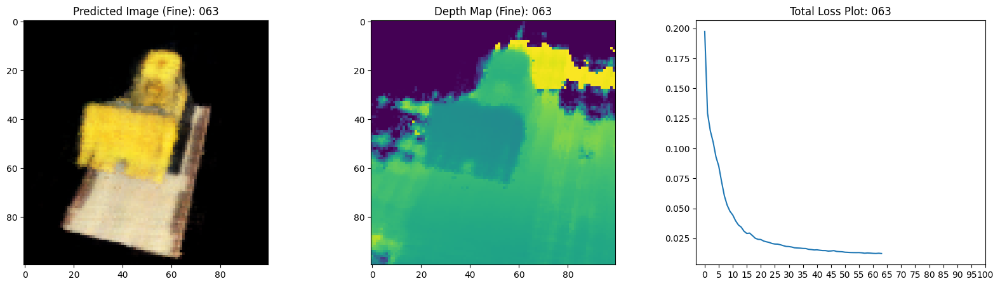

16/16 [==============================] - 12s 725ms/step - loss: 0.0125 - coarse_loss: 0.0064 - fine_loss: 0.0060 - coarse_psnr: 22.1074 - psnr: 22.2499 - val_loss: 0.0129 - val_coarse_loss: 0.0065 - val_fine_loss: 0.0064 - val_coarse_psnr: 21.9524 - val_psnr: 21.9969
Epoch 65/100
16/16 [==============================] - ETA: 0s - loss: 0.0125 - coarse_loss: 0.0063 - fine_loss: 0.0059 - coarse_psnr: 22.1392 - psnr: 22.2827

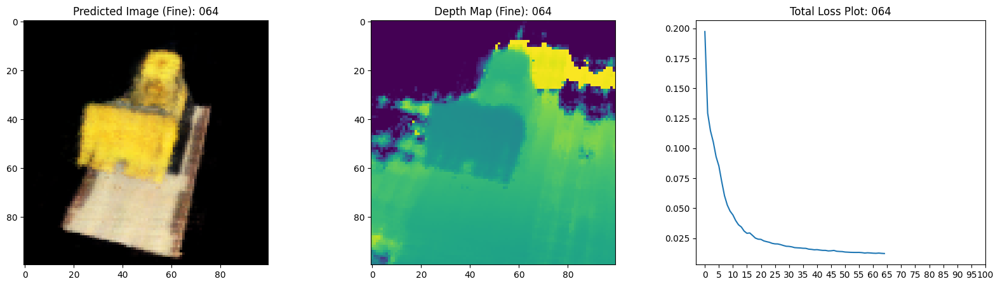

16/16 [==============================] - 11s 724ms/step - loss: 0.0125 - coarse_loss: 0.0063 - fine_loss: 0.0059 - coarse_psnr: 22.1392 - psnr: 22.2892 - val_loss: 0.0120 - val_coarse_loss: 0.0060 - val_fine_loss: 0.0060 - val_coarse_psnr: 22.2905 - val_psnr: 22.3225
Epoch 66/100
16/16 [==============================] - ETA: 0s - loss: 0.0122 - coarse_loss: 0.0062 - fine_loss: 0.0058 - coarse_psnr: 22.2319 - psnr: 22.3822

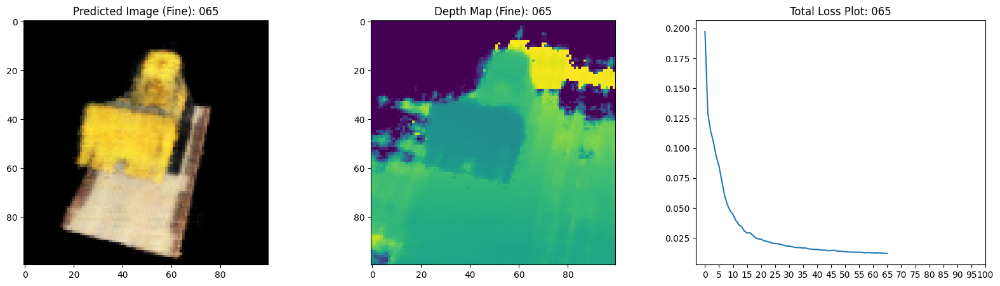

16/16 [==============================] - 12s 725ms/step - loss: 0.0122 - coarse_loss: 0.0062 - fine_loss: 0.0058 - coarse_psnr: 22.2319 - psnr: 22.3879 - val_loss: 0.0118 - val_coarse_loss: 0.0059 - val_fine_loss: 0.0059 - val_coarse_psnr: 22.4092 - val_psnr: 22.3975
Epoch 67/100
16/16 [==============================] - ETA: 0s - loss: 0.0119 - coarse_loss: 0.0061 - fine_loss: 0.0058 - coarse_psnr: 22.2909 - psnr: 22.4828

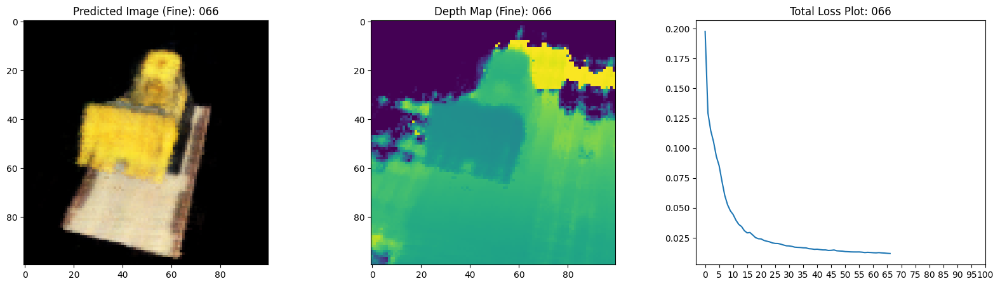

16/16 [==============================] - 12s 741ms/step - loss: 0.0119 - coarse_loss: 0.0061 - fine_loss: 0.0058 - coarse_psnr: 22.2909 - psnr: 22.4858 - val_loss: 0.0119 - val_coarse_loss: 0.0059 - val_fine_loss: 0.0060 - val_coarse_psnr: 22.4076 - val_psnr: 22.3308
Epoch 68/100
16/16 [==============================] - ETA: 0s - loss: 0.0119 - coarse_loss: 0.0060 - fine_loss: 0.0058 - coarse_psnr: 22.3220 - psnr: 22.4518

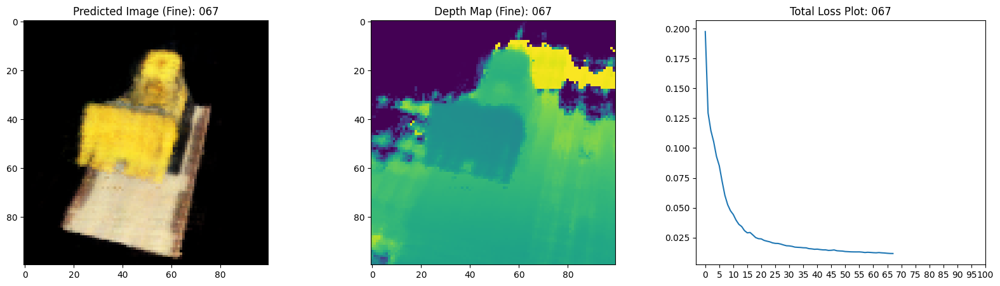

16/16 [==============================] - 12s 726ms/step - loss: 0.0119 - coarse_loss: 0.0060 - fine_loss: 0.0058 - coarse_psnr: 22.3220 - psnr: 22.4555 - val_loss: 0.0119 - val_coarse_loss: 0.0059 - val_fine_loss: 0.0060 - val_coarse_psnr: 22.4165 - val_psnr: 22.3092
Epoch 69/100
16/16 [==============================] - ETA: 0s - loss: 0.0121 - coarse_loss: 0.0061 - fine_loss: 0.0059 - coarse_psnr: 22.2971 - psnr: 22.3580

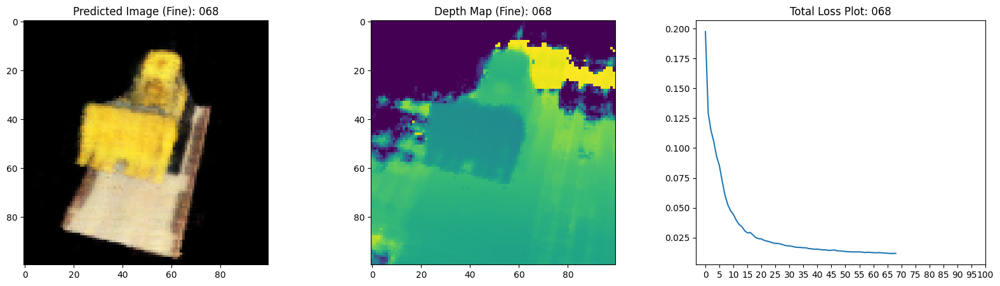

16/16 [==============================] - 12s 725ms/step - loss: 0.0121 - coarse_loss: 0.0061 - fine_loss: 0.0059 - coarse_psnr: 22.2971 - psnr: 22.3633 - val_loss: 0.0123 - val_coarse_loss: 0.0061 - val_fine_loss: 0.0062 - val_coarse_psnr: 22.2150 - val_psnr: 22.1069
Epoch 70/100
16/16 [==============================] - ETA: 0s - loss: 0.0120 - coarse_loss: 0.0060 - fine_loss: 0.0057 - coarse_psnr: 22.3753 - psnr: 22.4264

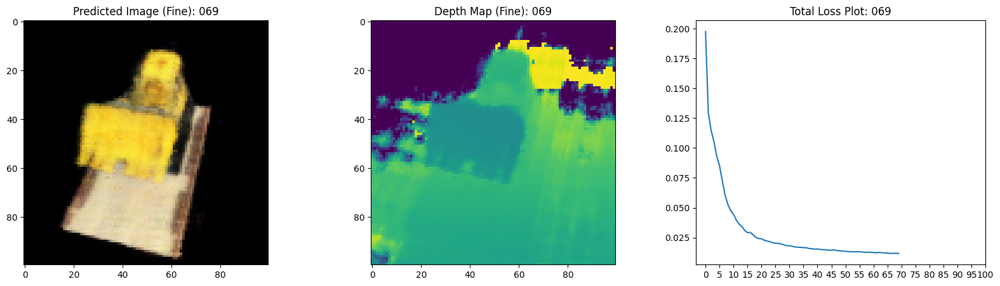

16/16 [==============================] - 12s 725ms/step - loss: 0.0120 - coarse_loss: 0.0060 - fine_loss: 0.0057 - coarse_psnr: 22.3753 - psnr: 22.4341 - val_loss: 0.0116 - val_coarse_loss: 0.0058 - val_fine_loss: 0.0058 - val_coarse_psnr: 22.4955 - val_psnr: 22.4285
Epoch 71/100
16/16 [==============================] - ETA: 0s - loss: 0.0119 - coarse_loss: 0.0059 - fine_loss: 0.0057 - coarse_psnr: 22.4023 - psnr: 22.4803

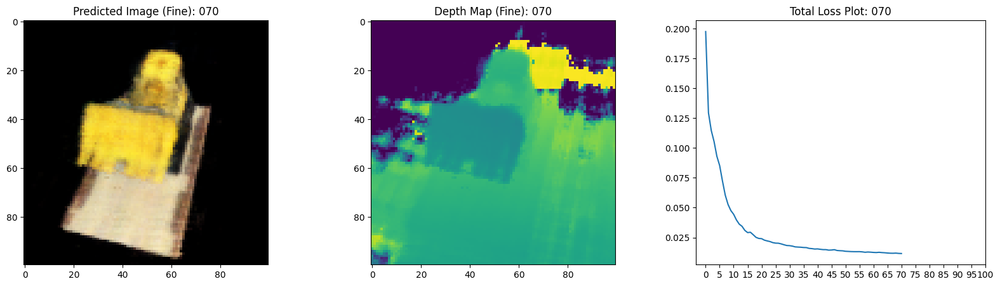

16/16 [==============================] - 12s 726ms/step - loss: 0.0118 - coarse_loss: 0.0059 - fine_loss: 0.0057 - coarse_psnr: 22.4023 - psnr: 22.4881 - val_loss: 0.0119 - val_coarse_loss: 0.0059 - val_fine_loss: 0.0060 - val_coarse_psnr: 22.3534 - val_psnr: 22.3021
Epoch 72/100
16/16 [==============================] - ETA: 0s - loss: 0.0118 - coarse_loss: 0.0059 - fine_loss: 0.0056 - coarse_psnr: 22.4073 - psnr: 22.4761

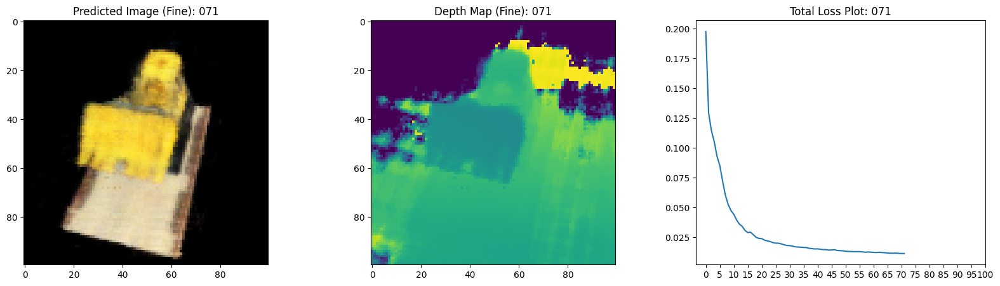

16/16 [==============================] - 12s 725ms/step - loss: 0.0118 - coarse_loss: 0.0059 - fine_loss: 0.0056 - coarse_psnr: 22.4073 - psnr: 22.4847 - val_loss: 0.0122 - val_coarse_loss: 0.0061 - val_fine_loss: 0.0061 - val_coarse_psnr: 22.1762 - val_psnr: 22.2198
Epoch 73/100
16/16 [==============================] - ETA: 0s - loss: 0.0120 - coarse_loss: 0.0059 - fine_loss: 0.0056 - coarse_psnr: 22.4354 - psnr: 22.4537

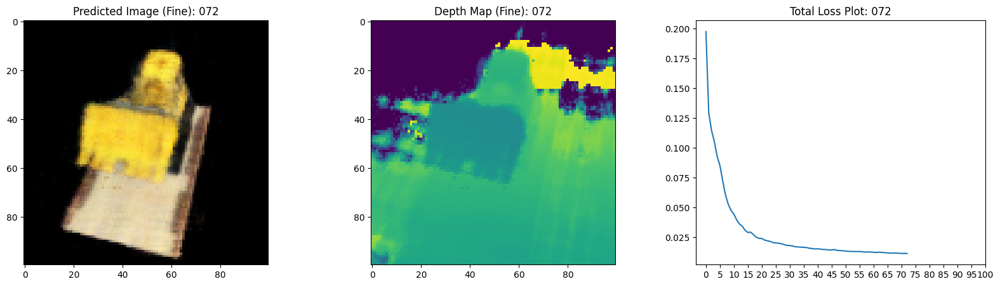

16/16 [==============================] - 12s 726ms/step - loss: 0.0119 - coarse_loss: 0.0059 - fine_loss: 0.0056 - coarse_psnr: 22.4354 - psnr: 22.4660 - val_loss: 0.0115 - val_coarse_loss: 0.0057 - val_fine_loss: 0.0058 - val_coarse_psnr: 22.4826 - val_psnr: 22.4411
Epoch 74/100
16/16 [==============================] - ETA: 0s - loss: 0.0115 - coarse_loss: 0.0057 - fine_loss: 0.0055 - coarse_psnr: 22.5477 - psnr: 22.6471

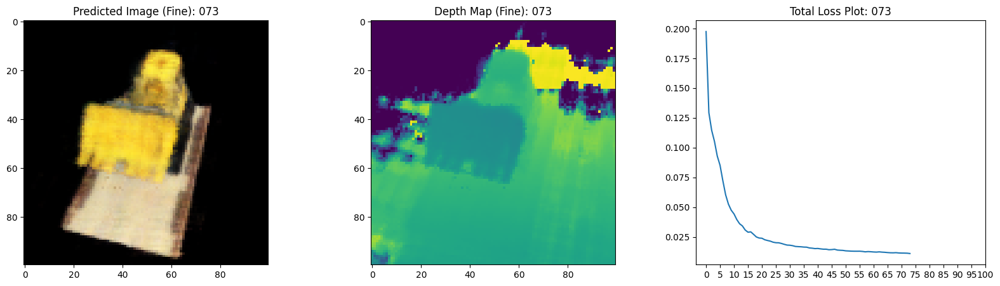

16/16 [==============================] - 12s 725ms/step - loss: 0.0115 - coarse_loss: 0.0057 - fine_loss: 0.0055 - coarse_psnr: 22.5477 - psnr: 22.6535 - val_loss: 0.0115 - val_coarse_loss: 0.0057 - val_fine_loss: 0.0058 - val_coarse_psnr: 22.4893 - val_psnr: 22.4446
Epoch 75/100
16/16 [==============================] - ETA: 0s - loss: 0.0113 - coarse_loss: 0.0057 - fine_loss: 0.0055 - coarse_psnr: 22.5836 - psnr: 22.6682

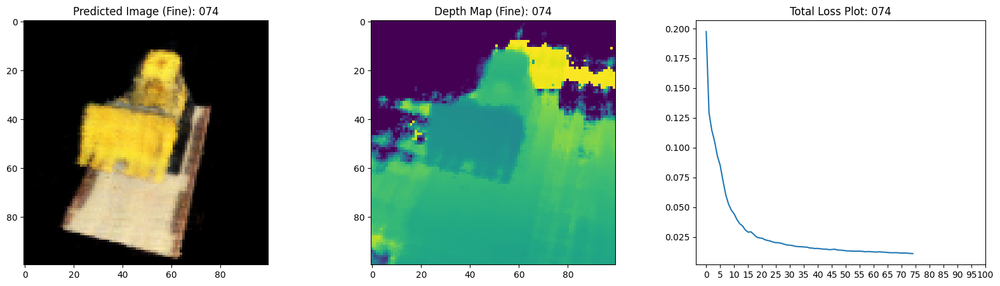

16/16 [==============================] - 12s 726ms/step - loss: 0.0113 - coarse_loss: 0.0057 - fine_loss: 0.0055 - coarse_psnr: 22.5836 - psnr: 22.6728 - val_loss: 0.0112 - val_coarse_loss: 0.0056 - val_fine_loss: 0.0056 - val_coarse_psnr: 22.6377 - val_psnr: 22.5904
Epoch 76/100
16/16 [==============================] - ETA: 0s - loss: 0.0112 - coarse_loss: 0.0056 - fine_loss: 0.0054 - coarse_psnr: 22.6644 - psnr: 22.6928

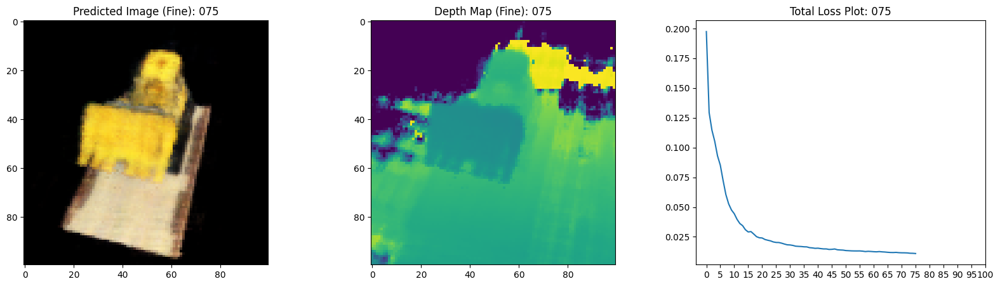

16/16 [==============================] - 12s 740ms/step - loss: 0.0112 - coarse_loss: 0.0056 - fine_loss: 0.0054 - coarse_psnr: 22.6644 - psnr: 22.7002 - val_loss: 0.0110 - val_coarse_loss: 0.0055 - val_fine_loss: 0.0055 - val_coarse_psnr: 22.7429 - val_psnr: 22.7062
Epoch 77/100
16/16 [==============================] - ETA: 0s - loss: 0.0111 - coarse_loss: 0.0055 - fine_loss: 0.0053 - coarse_psnr: 22.7570 - psnr: 22.7580

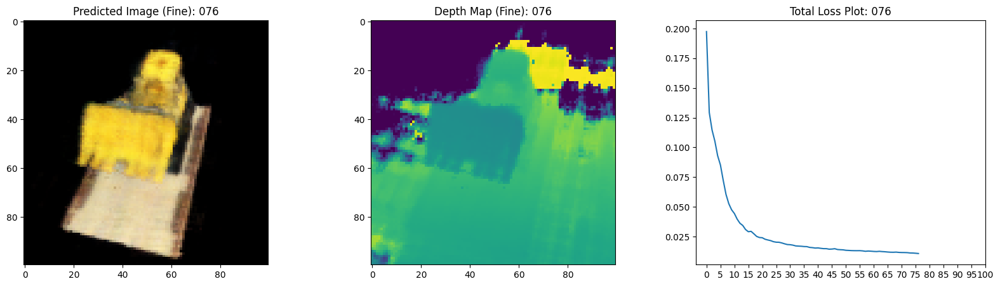

16/16 [==============================] - 12s 726ms/step - loss: 0.0111 - coarse_loss: 0.0055 - fine_loss: 0.0053 - coarse_psnr: 22.7570 - psnr: 22.7674 - val_loss: 0.0111 - val_coarse_loss: 0.0056 - val_fine_loss: 0.0055 - val_coarse_psnr: 22.6465 - val_psnr: 22.6468
Epoch 78/100
16/16 [==============================] - ETA: 0s - loss: 0.0110 - coarse_loss: 0.0055 - fine_loss: 0.0053 - coarse_psnr: 22.6901 - psnr: 22.7934

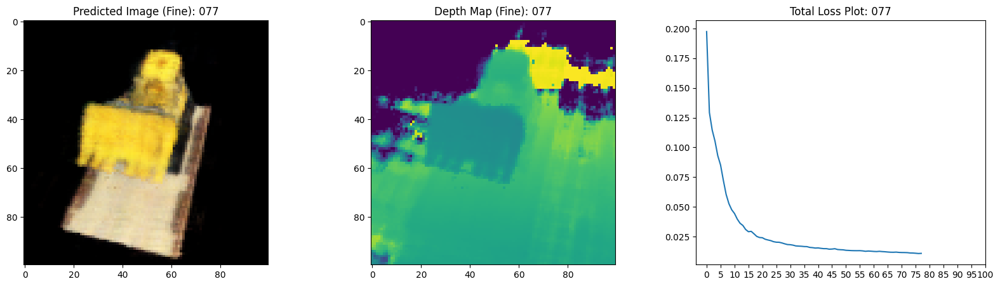

16/16 [==============================] - 12s 726ms/step - loss: 0.0110 - coarse_loss: 0.0055 - fine_loss: 0.0053 - coarse_psnr: 22.6901 - psnr: 22.7981 - val_loss: 0.0114 - val_coarse_loss: 0.0057 - val_fine_loss: 0.0057 - val_coarse_psnr: 22.5289 - val_psnr: 22.5141
Epoch 79/100
16/16 [==============================] - ETA: 0s - loss: 0.0113 - coarse_loss: 0.0057 - fine_loss: 0.0054 - coarse_psnr: 22.5892 - psnr: 22.6884

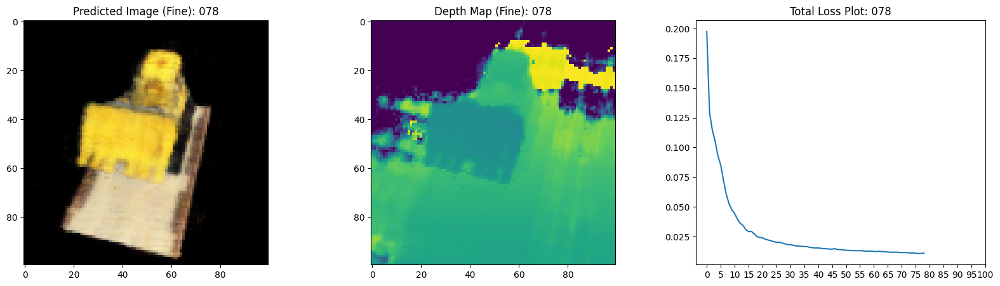

16/16 [==============================] - 12s 726ms/step - loss: 0.0113 - coarse_loss: 0.0057 - fine_loss: 0.0054 - coarse_psnr: 22.5892 - psnr: 22.6969 - val_loss: 0.0114 - val_coarse_loss: 0.0058 - val_fine_loss: 0.0057 - val_coarse_psnr: 22.4666 - val_psnr: 22.5261
Epoch 80/100
16/16 [==============================] - ETA: 0s - loss: 0.0112 - coarse_loss: 0.0057 - fine_loss: 0.0053 - coarse_psnr: 22.6124 - psnr: 22.7854

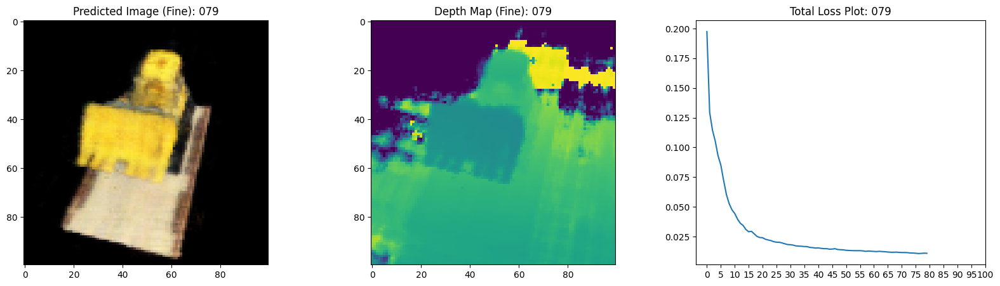

16/16 [==============================] - 12s 726ms/step - loss: 0.0112 - coarse_loss: 0.0057 - fine_loss: 0.0053 - coarse_psnr: 22.6124 - psnr: 22.7929 - val_loss: 0.0111 - val_coarse_loss: 0.0055 - val_fine_loss: 0.0055 - val_coarse_psnr: 22.6723 - val_psnr: 22.6699
Epoch 81/100
16/16 [==============================] - ETA: 0s - loss: 0.0111 - coarse_loss: 0.0056 - fine_loss: 0.0053 - coarse_psnr: 22.6837 - psnr: 22.7877

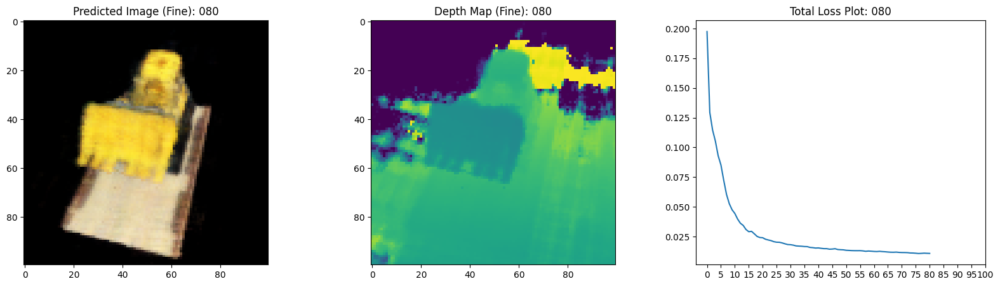

16/16 [==============================] - 11s 724ms/step - loss: 0.0111 - coarse_loss: 0.0056 - fine_loss: 0.0053 - coarse_psnr: 22.6837 - psnr: 22.7946 - val_loss: 0.0113 - val_coarse_loss: 0.0058 - val_fine_loss: 0.0056 - val_coarse_psnr: 22.4709 - val_psnr: 22.6347
Epoch 82/100
16/16 [==============================] - ETA: 0s - loss: 0.0111 - coarse_loss: 0.0055 - fine_loss: 0.0052 - coarse_psnr: 22.7404 - psnr: 22.7997

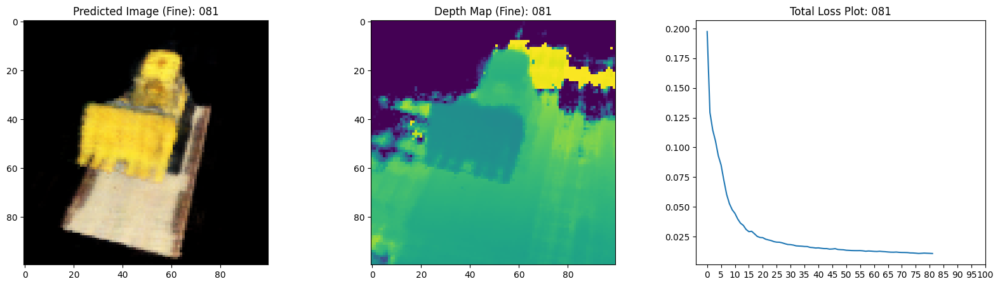

16/16 [==============================] - 12s 726ms/step - loss: 0.0111 - coarse_loss: 0.0055 - fine_loss: 0.0052 - coarse_psnr: 22.7404 - psnr: 22.8097 - val_loss: 0.0106 - val_coarse_loss: 0.0053 - val_fine_loss: 0.0054 - val_coarse_psnr: 22.8784 - val_psnr: 22.8142
Epoch 83/100
16/16 [==============================] - ETA: 0s - loss: 0.0109 - coarse_loss: 0.0054 - fine_loss: 0.0053 - coarse_psnr: 22.7795 - psnr: 22.8469

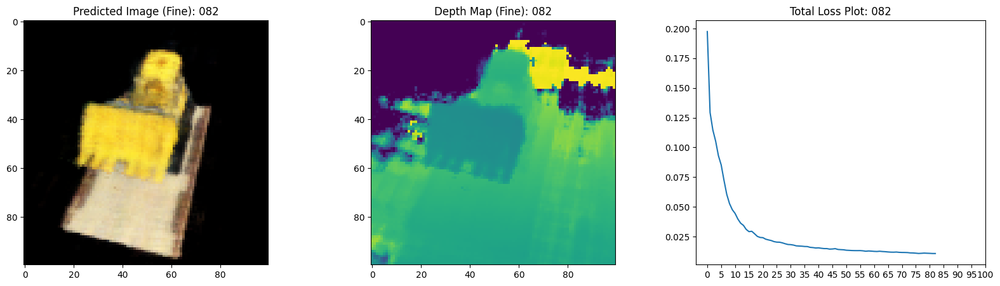

16/16 [==============================] - 12s 725ms/step - loss: 0.0109 - coarse_loss: 0.0054 - fine_loss: 0.0053 - coarse_psnr: 22.7795 - psnr: 22.8516 - val_loss: 0.0114 - val_coarse_loss: 0.0056 - val_fine_loss: 0.0058 - val_coarse_psnr: 22.6279 - val_psnr: 22.4135
Epoch 84/100
16/16 [==============================] - ETA: 0s - loss: 0.0110 - coarse_loss: 0.0054 - fine_loss: 0.0053 - coarse_psnr: 22.8007 - psnr: 22.7505

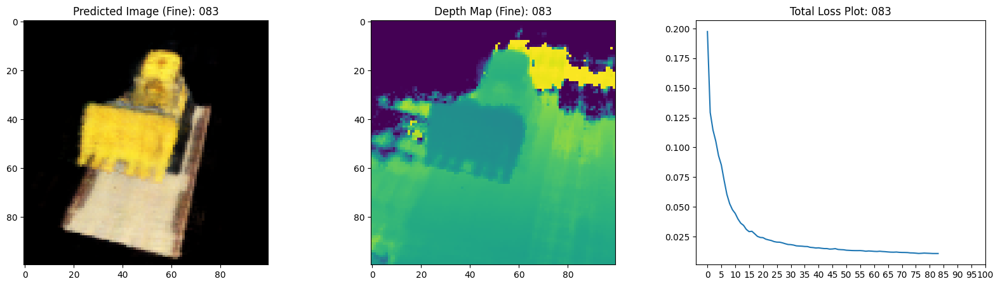

16/16 [==============================] - 12s 725ms/step - loss: 0.0110 - coarse_loss: 0.0054 - fine_loss: 0.0053 - coarse_psnr: 22.8007 - psnr: 22.7597 - val_loss: 0.0109 - val_coarse_loss: 0.0054 - val_fine_loss: 0.0055 - val_coarse_psnr: 22.7763 - val_psnr: 22.6924
Epoch 85/100
16/16 [==============================] - ETA: 0s - loss: 0.0107 - coarse_loss: 0.0053 - fine_loss: 0.0052 - coarse_psnr: 22.9036 - psnr: 22.8861

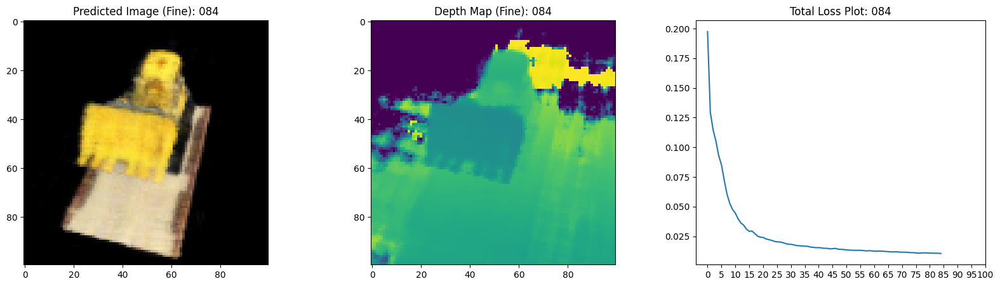

16/16 [==============================] - 12s 726ms/step - loss: 0.0107 - coarse_loss: 0.0053 - fine_loss: 0.0052 - coarse_psnr: 22.9036 - psnr: 22.8941 - val_loss: 0.0104 - val_coarse_loss: 0.0052 - val_fine_loss: 0.0052 - val_coarse_psnr: 22.9775 - val_psnr: 22.8954
Epoch 86/100
16/16 [==============================] - ETA: 0s - loss: 0.0105 - coarse_loss: 0.0053 - fine_loss: 0.0051 - coarse_psnr: 22.9240 - psnr: 23.0030

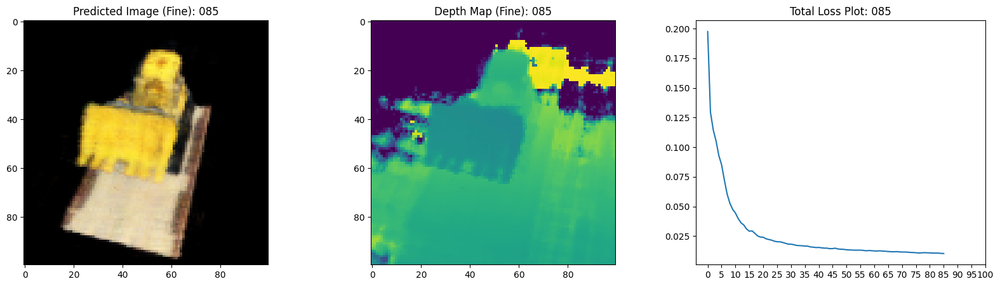

16/16 [==============================] - 12s 741ms/step - loss: 0.0105 - coarse_loss: 0.0053 - fine_loss: 0.0051 - coarse_psnr: 22.9240 - psnr: 23.0075 - val_loss: 0.0104 - val_coarse_loss: 0.0052 - val_fine_loss: 0.0052 - val_coarse_psnr: 22.9559 - val_psnr: 22.9211
Epoch 87/100
16/16 [==============================] - ETA: 0s - loss: 0.0106 - coarse_loss: 0.0054 - fine_loss: 0.0050 - coarse_psnr: 22.8407 - psnr: 23.0235

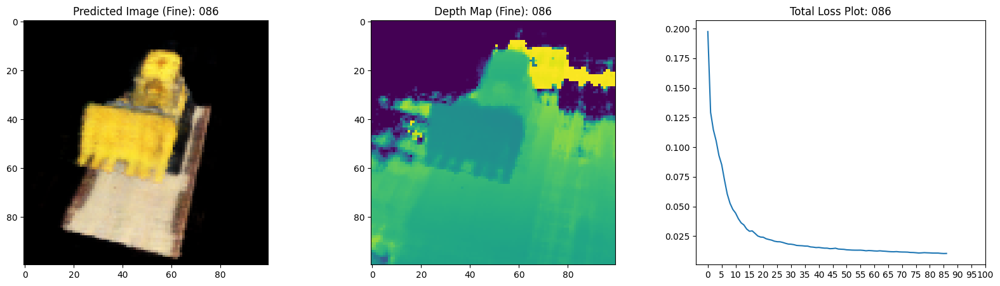

16/16 [==============================] - 12s 726ms/step - loss: 0.0106 - coarse_loss: 0.0054 - fine_loss: 0.0050 - coarse_psnr: 22.8407 - psnr: 23.0291 - val_loss: 0.0102 - val_coarse_loss: 0.0051 - val_fine_loss: 0.0050 - val_coarse_psnr: 23.0246 - val_psnr: 23.0827
Epoch 88/100
16/16 [==============================] - ETA: 0s - loss: 0.0104 - coarse_loss: 0.0052 - fine_loss: 0.0049 - coarse_psnr: 22.9761 - psnr: 23.1028

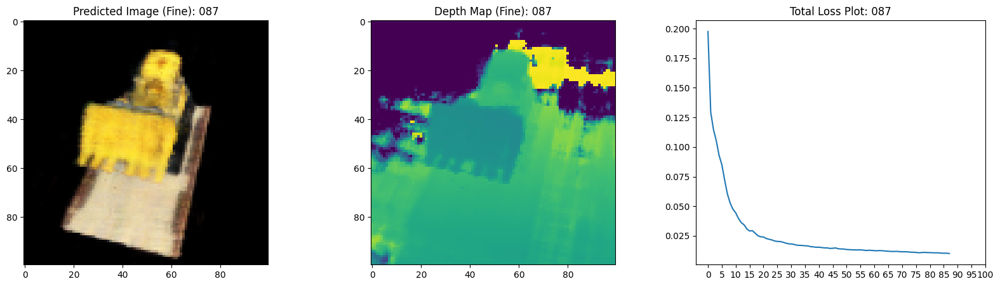

16/16 [==============================] - 12s 726ms/step - loss: 0.0104 - coarse_loss: 0.0052 - fine_loss: 0.0049 - coarse_psnr: 22.9761 - psnr: 23.1110 - val_loss: 0.0099 - val_coarse_loss: 0.0050 - val_fine_loss: 0.0049 - val_coarse_psnr: 23.1472 - val_psnr: 23.1948
Epoch 89/100
16/16 [==============================] - ETA: 0s - loss: 0.0102 - coarse_loss: 0.0051 - fine_loss: 0.0049 - coarse_psnr: 23.0185 - psnr: 23.1737

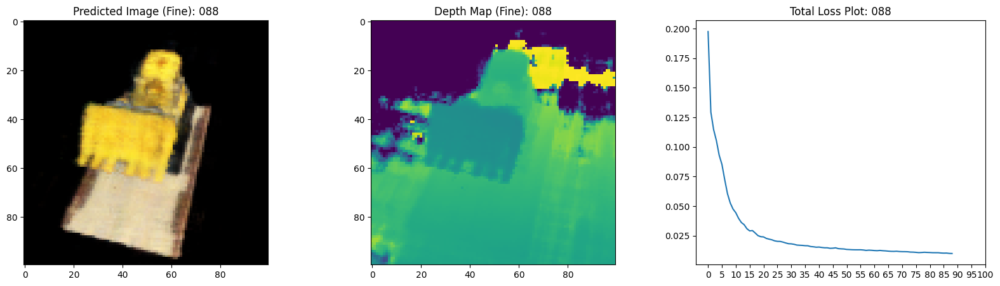

16/16 [==============================] - 12s 725ms/step - loss: 0.0102 - coarse_loss: 0.0051 - fine_loss: 0.0049 - coarse_psnr: 23.0185 - psnr: 23.1780 - val_loss: 0.0101 - val_coarse_loss: 0.0051 - val_fine_loss: 0.0050 - val_coarse_psnr: 23.0082 - val_psnr: 23.0609
Epoch 90/100
16/16 [==============================] - ETA: 0s - loss: 0.0103 - coarse_loss: 0.0053 - fine_loss: 0.0050 - coarse_psnr: 22.8835 - psnr: 23.1291

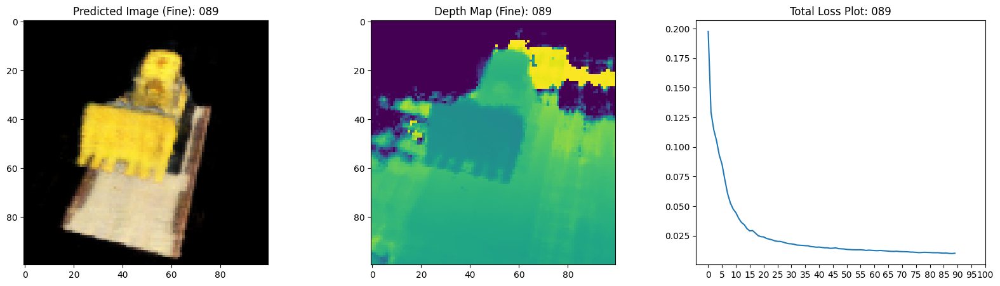

16/16 [==============================] - 12s 726ms/step - loss: 0.0103 - coarse_loss: 0.0053 - fine_loss: 0.0050 - coarse_psnr: 22.8835 - psnr: 23.1306 - val_loss: 0.0108 - val_coarse_loss: 0.0055 - val_fine_loss: 0.0054 - val_coarse_psnr: 22.6834 - val_psnr: 22.7877
Epoch 91/100
16/16 [==============================] - ETA: 0s - loss: 0.0109 - coarse_loss: 0.0056 - fine_loss: 0.0051 - coarse_psnr: 22.6901 - psnr: 22.9625

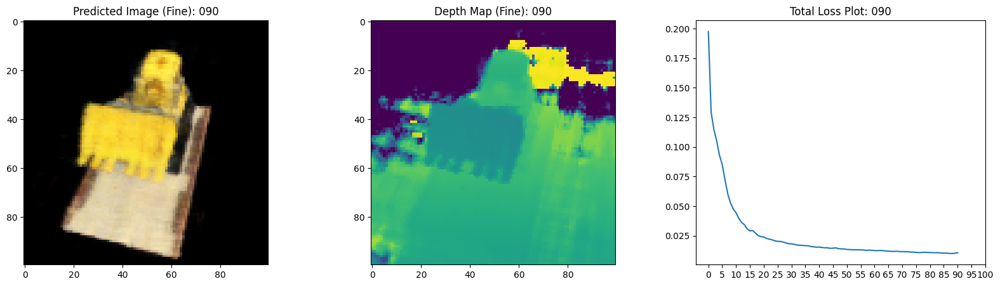

16/16 [==============================] - 12s 725ms/step - loss: 0.0109 - coarse_loss: 0.0056 - fine_loss: 0.0051 - coarse_psnr: 22.6901 - psnr: 22.9680 - val_loss: 0.0109 - val_coarse_loss: 0.0055 - val_fine_loss: 0.0054 - val_coarse_psnr: 22.6561 - val_psnr: 22.7365
Epoch 92/100
16/16 [==============================] - ETA: 0s - loss: 0.0107 - coarse_loss: 0.0054 - fine_loss: 0.0052 - coarse_psnr: 22.7945 - psnr: 22.9439

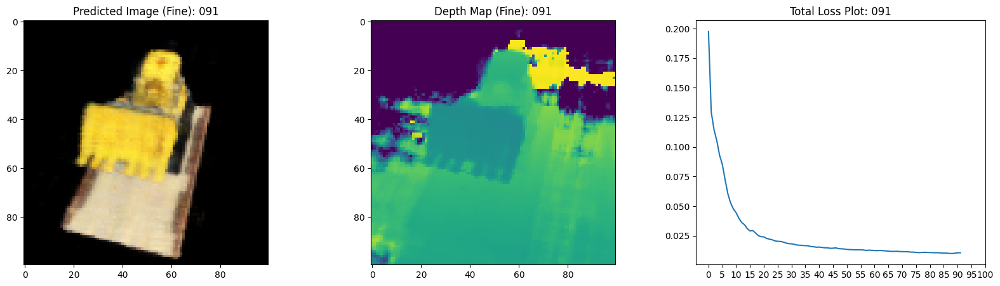

16/16 [==============================] - 12s 726ms/step - loss: 0.0107 - coarse_loss: 0.0054 - fine_loss: 0.0052 - coarse_psnr: 22.7945 - psnr: 22.9472 - val_loss: 0.0107 - val_coarse_loss: 0.0054 - val_fine_loss: 0.0053 - val_coarse_psnr: 22.7548 - val_psnr: 22.8172
Epoch 93/100
16/16 [==============================] - ETA: 0s - loss: 0.0103 - coarse_loss: 0.0052 - fine_loss: 0.0050 - coarse_psnr: 23.0159 - psnr: 23.0560

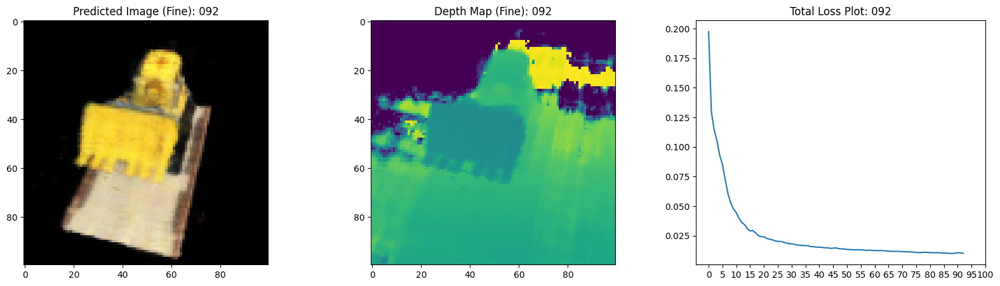

16/16 [==============================] - 12s 725ms/step - loss: 0.0103 - coarse_loss: 0.0052 - fine_loss: 0.0050 - coarse_psnr: 23.0159 - psnr: 23.0632 - val_loss: 0.0108 - val_coarse_loss: 0.0054 - val_fine_loss: 0.0054 - val_coarse_psnr: 22.7897 - val_psnr: 22.7648
Epoch 94/100
16/16 [==============================] - ETA: 0s - loss: 0.0105 - coarse_loss: 0.0053 - fine_loss: 0.0050 - coarse_psnr: 22.9318 - psnr: 23.0099

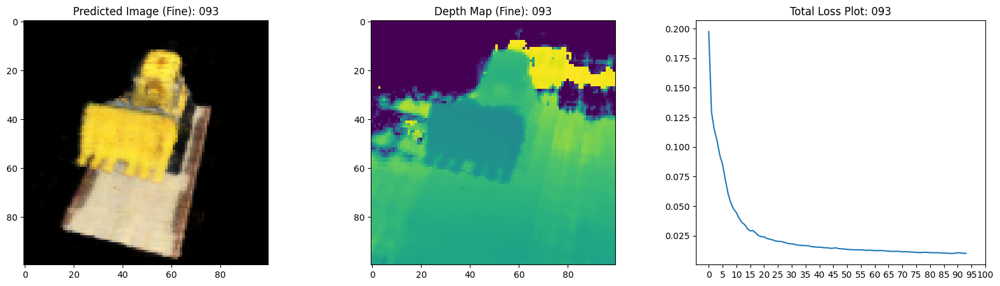

16/16 [==============================] - 11s 724ms/step - loss: 0.0105 - coarse_loss: 0.0053 - fine_loss: 0.0050 - coarse_psnr: 22.9318 - psnr: 23.0183 - val_loss: 0.0106 - val_coarse_loss: 0.0051 - val_fine_loss: 0.0054 - val_coarse_psnr: 22.9793 - val_psnr: 22.7026
Epoch 95/100
16/16 [==============================] - ETA: 0s - loss: 0.0102 - coarse_loss: 0.0050 - fine_loss: 0.0049 - coarse_psnr: 23.1243 - psnr: 23.0528

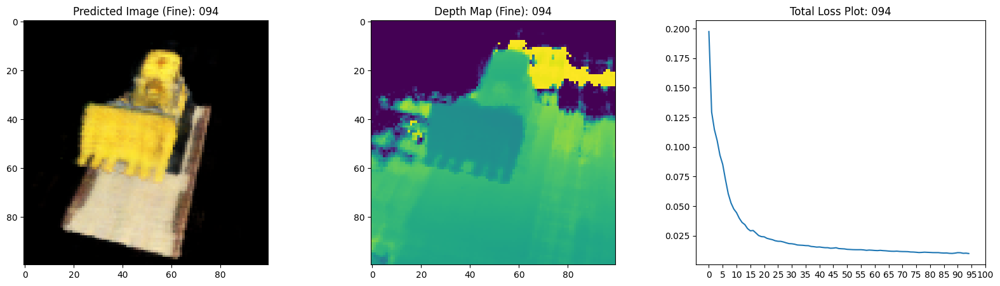

16/16 [==============================] - 12s 742ms/step - loss: 0.0102 - coarse_loss: 0.0050 - fine_loss: 0.0049 - coarse_psnr: 23.1243 - psnr: 23.0622 - val_loss: 0.0101 - val_coarse_loss: 0.0050 - val_fine_loss: 0.0051 - val_coarse_psnr: 23.1049 - val_psnr: 23.0388
Epoch 96/100
16/16 [==============================] - ETA: 0s - loss: 0.0100 - coarse_loss: 0.0049 - fine_loss: 0.0049 - coarse_psnr: 23.1977 - psnr: 23.1440

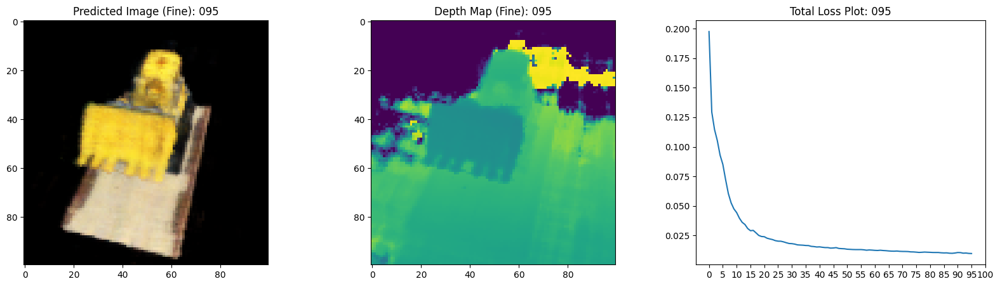

16/16 [==============================] - 12s 727ms/step - loss: 0.0100 - coarse_loss: 0.0049 - fine_loss: 0.0049 - coarse_psnr: 23.1977 - psnr: 23.1504 - val_loss: 0.0099 - val_coarse_loss: 0.0050 - val_fine_loss: 0.0049 - val_coarse_psnr: 23.1435 - val_psnr: 23.1620
Epoch 97/100
16/16 [==============================] - ETA: 0s - loss: 0.0099 - coarse_loss: 0.0050 - fine_loss: 0.0048 - coarse_psnr: 23.1824 - psnr: 23.2454

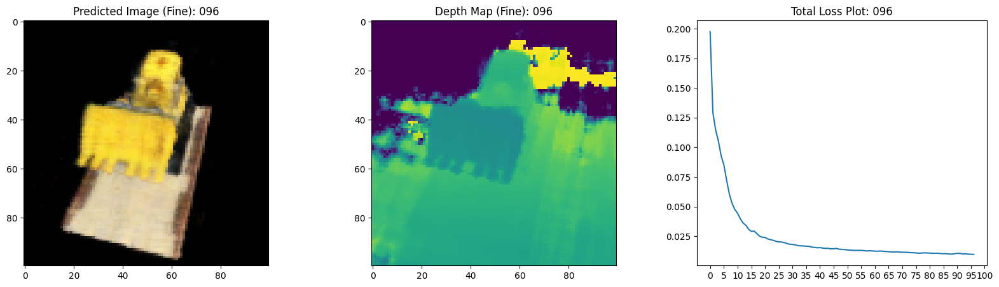

16/16 [==============================] - 12s 726ms/step - loss: 0.0099 - coarse_loss: 0.0050 - fine_loss: 0.0048 - coarse_psnr: 23.1824 - psnr: 23.2499 - val_loss: 0.0098 - val_coarse_loss: 0.0049 - val_fine_loss: 0.0049 - val_coarse_psnr: 23.1873 - val_psnr: 23.1938
Epoch 98/100
16/16 [==============================] - ETA: 0s - loss: 0.0099 - coarse_loss: 0.0050 - fine_loss: 0.0048 - coarse_psnr: 23.1449 - psnr: 23.2532

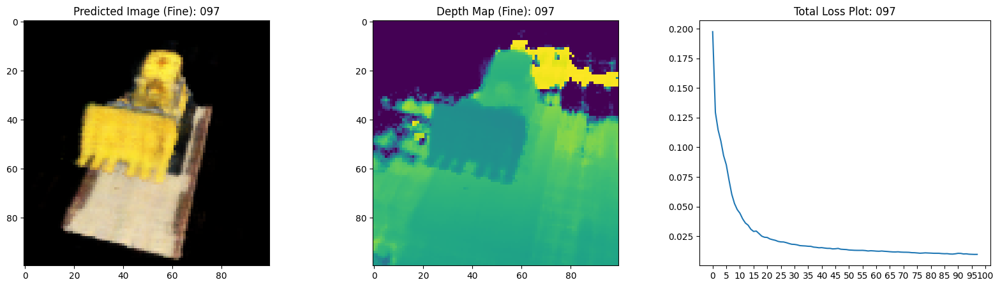

16/16 [==============================] - 12s 725ms/step - loss: 0.0099 - coarse_loss: 0.0050 - fine_loss: 0.0048 - coarse_psnr: 23.1449 - psnr: 23.2567 - val_loss: 0.0096 - val_coarse_loss: 0.0048 - val_fine_loss: 0.0048 - val_coarse_psnr: 23.2947 - val_psnr: 23.2626
Epoch 99/100
16/16 [==============================] - ETA: 0s - loss: 0.0098 - coarse_loss: 0.0049 - fine_loss: 0.0047 - coarse_psnr: 23.2292 - psnr: 23.2683

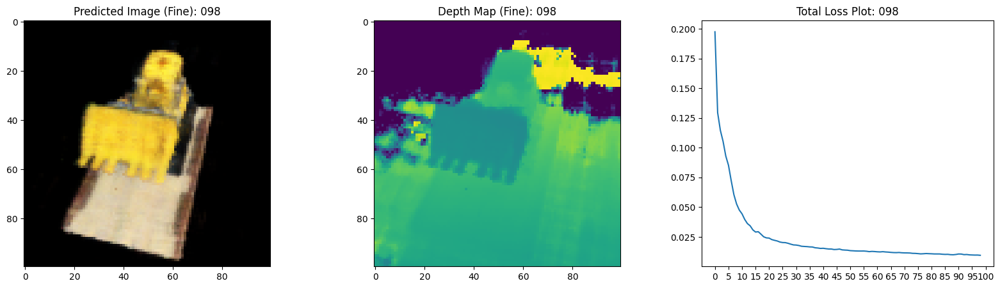

16/16 [==============================] - 12s 725ms/step - loss: 0.0098 - coarse_loss: 0.0049 - fine_loss: 0.0047 - coarse_psnr: 23.2292 - psnr: 23.2771 - val_loss: 0.0096 - val_coarse_loss: 0.0049 - val_fine_loss: 0.0048 - val_coarse_psnr: 23.2123 - val_psnr: 23.3031
Epoch 100/100
16/16 [==============================] - ETA: 0s - loss: 0.0096 - coarse_loss: 0.0048 - fine_loss: 0.0046 - coarse_psnr: 23.2753 - psnr: 23.3984

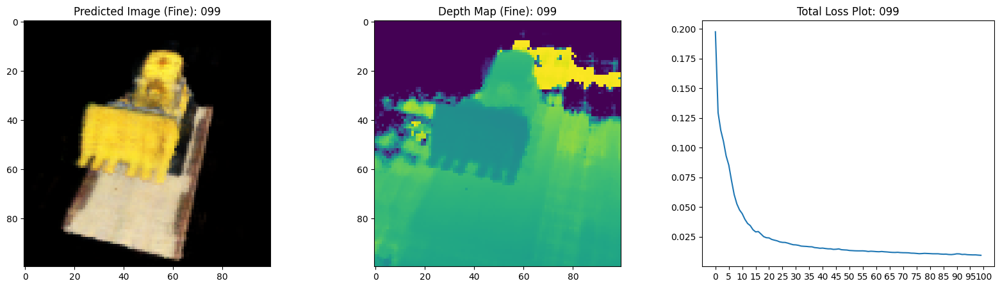

16/16 [==============================] - 11s 725ms/step - loss: 0.0096 - coarse_loss: 0.0048 - fine_loss: 0.0046 - coarse_psnr: 23.2753 - psnr: 23.4055 - val_loss: 0.0096 - val_coarse_loss: 0.0048 - val_fine_loss: 0.0048 - val_coarse_psnr: 23.3163 - val_psnr: 23.2959


100%|██████████| 100/100 [00:01<00:00, 80.47it/s]


In [6]:
class NeRF(keras.Model):
    def __init__(self, nerf_model_coarse, nerf_model_fine):
        super().__init__()
        self.nerf_model_coarse = nerf_model_coarse
        self.nerf_model_fine = nerf_model_fine

    def compile(self, optimizer_coarse, optimizer_fine, loss_fn):
        super().compile()
        self.optimizer_coarse = optimizer_coarse
        self.optimizer_fine = optimizer_fine
        self.loss_fn = loss_fn
        
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.coarse_loss_tracker = keras.metrics.Mean(name="coarse_loss")
        self.fine_loss_tracker = keras.metrics.Mean(name="fine_loss")
        self.coarse_psnr_metric = keras.metrics.Mean(name="coarse_psnr")
        self.fine_psnr_metric = keras.metrics.Mean(name="fine_psnr") # 대표 PSNR

    def train_step(self, inputs):
        (images, rays_od) = inputs # rays_od는 (ray_origins, ray_directions) 튜플
        ray_origins, ray_directions = rays_od

        with tf.GradientTape(persistent=True) as tape:
            rgb_fine, _, extras = render_rays_hierarchical( # 이전 셀에서 정의한 함수
                model_coarse=self.nerf_model_coarse,
                model_fine=self.nerf_model_fine,
                ray_origins=ray_origins,
                ray_directions=ray_directions,
                near=2.0, # 하드코딩된 값, 필요시 전역 변수 또는 인자로 변경
                far=6.0,  # 하드코딩된 값, 필요시 전역 변수 또는 인자로 변경
                perturb_coarse=True, # 학습 시에는 Coarse 샘플링도 stratified
                train=True
            )
            rgb_coarse = extras["rgb_coarse"]

            loss_coarse = self.loss_fn(images, rgb_coarse)
            loss_fine = self.loss_fn(images, rgb_fine)
            total_loss = loss_coarse + loss_fine

        # Coarse 모델 그래디언트 및 최적화
        trainable_vars_coarse = self.nerf_model_coarse.trainable_variables
        gradients_coarse = tape.gradient(total_loss, trainable_vars_coarse)
        self.optimizer_coarse.apply_gradients(zip(gradients_coarse, trainable_vars_coarse))

        # Fine 모델 그래디언트 및 최적화
        trainable_vars_fine = self.nerf_model_fine.trainable_variables
        gradients_fine = tape.gradient(total_loss, trainable_vars_fine)
        self.optimizer_fine.apply_gradients(zip(gradients_fine, trainable_vars_fine))
        
        del tape # persistent=True 사용 후 명시적 삭제

        psnr_coarse_val = tf.image.psnr(images, rgb_coarse, max_val=1.0)
        psnr_fine_val = tf.image.psnr(images, rgb_fine, max_val=1.0)

        self.total_loss_tracker.update_state(total_loss)
        self.coarse_loss_tracker.update_state(loss_coarse)
        self.fine_loss_tracker.update_state(loss_fine)
        self.coarse_psnr_metric.update_state(psnr_coarse_val)
        self.fine_psnr_metric.update_state(psnr_fine_val)
        
        return {
            "loss": self.total_loss_tracker.result(), # 대표 loss는 total로
            "coarse_loss": self.coarse_loss_tracker.result(),
            "fine_loss": self.fine_loss_tracker.result(),
            "coarse_psnr": self.coarse_psnr_metric.result(),
            "psnr": self.fine_psnr_metric.result(), # 대표 PSNR은 fine으로
        }

    def test_step(self, inputs):
        (images, rays_od) = inputs
        ray_origins, ray_directions = rays_od

        rgb_fine, _, extras = render_rays_hierarchical(
            model_coarse=self.nerf_model_coarse,
            model_fine=self.nerf_model_fine,
            ray_origins=ray_origins,
            ray_directions=ray_directions,
            near=2.0,
            far=6.0,
            perturb_coarse=False, # 평가 시에는 Coarse 샘플링도 deterministic
            train=False
        )
        rgb_coarse = extras["rgb_coarse"]
        
        loss_coarse = self.loss_fn(images, rgb_coarse)
        loss_fine = self.loss_fn(images, rgb_fine)
        total_loss = loss_coarse + loss_fine

        psnr_coarse_val = tf.image.psnr(images, rgb_coarse, max_val=1.0)
        psnr_fine_val = tf.image.psnr(images, rgb_fine, max_val=1.0)

        self.total_loss_tracker.update_state(total_loss)
        self.coarse_loss_tracker.update_state(loss_coarse)
        self.fine_loss_tracker.update_state(loss_fine)
        self.coarse_psnr_metric.update_state(psnr_coarse_val)
        self.fine_psnr_metric.update_state(psnr_fine_val)

        return {
            "loss": self.total_loss_tracker.result(),
            "coarse_loss": self.coarse_loss_tracker.result(),
            "fine_loss": self.fine_loss_tracker.result(),
            "coarse_psnr": self.coarse_psnr_metric.result(),
            "psnr": self.fine_psnr_metric.result(),
        }

    @property
    def metrics(self):
        return [
            self.total_loss_tracker, 
            self.coarse_loss_tracker, 
            self.fine_loss_tracker, 
            self.coarse_psnr_metric, 
            self.fine_psnr_metric
        ]

# TrainMonitor에서 사용할 고정된 테스트 광선 데이터 준비
# train_ds 또는 val_ds에서 한 배치를 가져옵니다.
# 이 코드는 model.fit() 호출 전에 실행되어야 합니다.
monitor_data_iter = iter(val_ds) # 검증 데이터셋 사용 권장, 없으면 train_ds
monitor_images_batch, (monitor_ray_origins_batch, monitor_ray_directions_batch) = next(monitor_data_iter)
del monitor_data_iter

loss_list = [] # TrainMonitor에서 사용

class TrainMonitor(keras.callbacks.Callback):
    def __init__(self, images_batch, ray_origins_batch, ray_directions_batch, near=2.0, far=6.0):
        super().__init__()
        self.images_batch = images_batch
        self.ray_origins_batch = ray_origins_batch
        self.ray_directions_batch = ray_directions_batch
        self.near = near
        self.far = far


    def on_epoch_end(self, epoch, logs=None):
        # logs에는 total_loss, coarse_loss, fine_loss, coarse_psnr, fine_psnr 등이 포함됨
        current_loss = logs.get("loss", None) # NeRF 모델의 'loss' metric (total_loss)
        if current_loss is not None:
            loss_list.append(current_loss)
        
        # 저장된 배치 데이터를 사용하여 이미지 생성
        recons_images_fine, depth_maps_fine, extras = render_rays_hierarchical(
            model_coarse=self.model.nerf_model_coarse, # 콜백 내에서는 self.model로 접근
            model_fine=self.model.nerf_model_fine,
            ray_origins=self.ray_origins_batch,
            ray_directions=self.ray_directions_batch,
            near=self.near, 
            far=self.far,
            perturb_coarse=False, # 시각화 시에는 deterministic
            train=False, # predict 모드
        )
        
        # Plot the rgb (fine), depth (fine) and the loss plot.
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
        ax[0].imshow(tf.keras.utils.array_to_img(recons_images_fine[0])) # 배치의 첫 번째 이미지
        ax[0].set_title(f"Predicted Image (Fine): {epoch:03d}")

        ax[1].imshow(tf.keras.utils.array_to_img(depth_maps_fine[0, ..., None]))
        ax[1].set_title(f"Depth Map (Fine): {epoch:03d}")

        if loss_list: # loss_list가 비어있지 않을 때만 plot
            ax[2].plot(loss_list)
            ax[2].set_xticks(np.arange(0, EPOCHS + 1, 5.0 if EPOCHS >=5 else 1.0))
            ax[2].set_title(f"Total Loss Plot: {epoch:03d}")

        fig.savefig(f"images/{epoch:03d}.png")
        plt.show() # 노트북에서 너무 많은 창이 뜨는 것을 방지하려면 주석 처리 권장
        plt.close(fig)


# 모델 생성
# SINGLE_COORD_ENCODED_DIMS는 이전 셀에서 정의된 전역 변수
nerf_model_coarse = get_nerf_model_modified(num_layers=8, encoded_dims_per_coord=SINGLE_COORD_ENCODED_DIMS)
nerf_model_fine = get_nerf_model_modified(num_layers=8, encoded_dims_per_coord=SINGLE_COORD_ENCODED_DIMS) # 동일 구조 사용

model = NeRF(nerf_model_coarse, nerf_model_fine)

# 옵티마이저 생성 (Coarse와 Fine에 대해 별도 또는 공유 가능)
# 여기서는 학습률이 동일한 별도의 옵티마이저 사용
optimizer_coarse = tf.keras.optimizers.Adam() # 원본 NeRF 학습률 참고
optimizer_fine = tf.keras.optimizers.Adam()

model.compile(
    optimizer_coarse=optimizer_coarse,
    optimizer_fine=optimizer_fine,
    loss_fn=keras.losses.MeanSquaredError()
)

# 이미지 저장 디렉토리 생성
if not os.path.exists("images"):
    os.makedirs("images")

# TrainMonitor 인스턴스 생성 시 준비된 데이터 전달
train_monitor_callback = TrainMonitor(
    images_batch=monitor_images_batch,
    ray_origins_batch=monitor_ray_origins_batch,
    ray_directions_batch=monitor_ray_directions_batch
)

# 모델 학습
history = model.fit(
    train_ds,
    validation_data=val_ds,
    # batch_size=BATCH_SIZE, # train_ds.batch(BATCH_SIZE)에서 이미 설정됨
    epochs=EPOCHS,
    callbacks=[train_monitor_callback], # 수정된 콜백 사용
)

# GIF 생성 함수 (변경 없음)
def create_gif(path_to_images, name_gif):
    filenames = glob.glob(path_to_images)
    filenames = sorted(filenames)
    if not filenames:
        print(f"No images found at {path_to_images} to create a GIF.")
        return
    images_for_gif = []
    for filename in tqdm(filenames):
        images_for_gif.append(imageio.imread(filename))
    kargs = {"duration": 0.25, "loop": 0} # loop=0 for infinite loop
    imageio.mimsave(name_gif, images_for_gif, "GIF", **kargs)

create_gif("images/*.png", "training_hierarchical.gif") # GIF 이름 변경

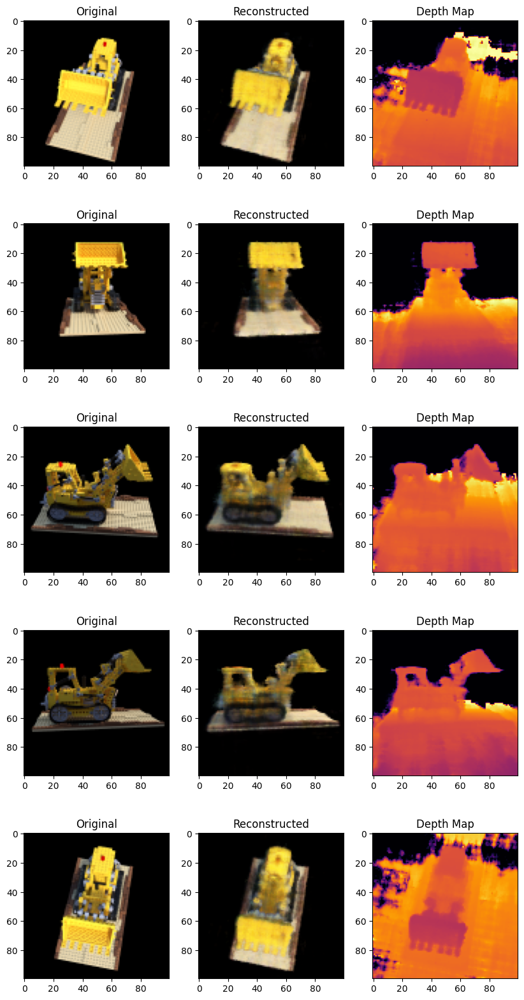

In [7]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from keras import utils

orig_images = monitor_images_batch

recons_images_fine, depth_maps_fine, _ = render_rays_hierarchical(
    model_coarse   = model.nerf_model_coarse,
    model_fine     = model.nerf_model_fine,
    ray_origins    = monitor_ray_origins_batch,
    ray_directions = monitor_ray_directions_batch,
    near           = 2.0,
    far            = 6.0,
    perturb_coarse = False,
    train          = False,
)

# Create subplots.
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(10, 20))

for ax, ori_img, recons_img, depth_map in zip(
    axes, orig_images, recons_images_fine, depth_maps_fine
):
    ax[0].imshow(keras.utils.array_to_img(ori_img))
    ax[0].set_title("Original")

    ax[1].imshow(keras.utils.array_to_img(recons_img))
    ax[1].set_title("Reconstructed")

    ax[2].imshow(keras.utils.array_to_img(depth_map[..., None]), cmap="inferno")
    ax[2].set_title("Depth Map")


In [8]:
import numpy as np
import tensorflow as tf
from tqdm import tqdm
import imageio

# --- Define camera pose helpers ---
def get_translation_t(t):
    """Get the translation matrix for movement in t."""
    matrix = [
        [1, 0, 0, 0],
        [0, 1, 0, 0],
        [0, 0, 1, t],
        [0, 0, 0, 1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)
 
def get_rotation_phi(phi):
    """Get the rotation matrix for movement in phi."""
    matrix = [
        [1, 0, 0, 0],
        [0, tf.cos(phi), -tf.sin(phi), 0],
        [0, tf.sin(phi),  tf.cos(phi), 0],
        [0, 0, 0, 1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)

def get_rotation_theta(theta):
    """Get the rotation matrix for movement in theta."""
    matrix = [
        [ tf.cos(theta), 0, -tf.sin(theta), 0],
        [ 0,             1,  0,             0],
        [ tf.sin(theta), 0,  tf.cos(theta), 0],
        [ 0,             0,  0,             1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)

def pose_spherical(theta, phi, t):
    """Build camera-to-world matrix from spherical angles (degrees) and radius t."""
    c2w = get_translation_t(t)
    c2w = get_rotation_phi(phi / 180.0 * np.pi) @ c2w
    c2w = get_rotation_theta(theta / 180.0 * np.pi) @ c2w
    # flip from OpenGL to our coords
    flip = np.array([[-1,0,0,0],[0,0,1,0],[0,1,0,0],[0,0,0,1]], dtype=np.float32)
    return flip @ c2w


In [9]:
import numpy as np
import tensorflow as tf
from tqdm import tqdm
import imageio

# … pose_spherical, get_rays, render_rays_hierarchical, model setup …

nerf_coarse = model.nerf_model_coarse
nerf_fine   = model.nerf_model_fine

rgb_frames = []
depth_frames = []
thetas = np.linspace(0.0, 360.0, 120, endpoint=False)

for theta in tqdm(thetas, desc="Rendering frames"):
    # 1) camera‐to‐world
    c2w = pose_spherical(theta, -30.0, 4.0)

    # 2) unbatched rays of shape (H, W, 3)
    ray_origins, ray_directions = get_rays(H, W, focal, c2w)

    # 3) add batch dim → (1, H, W, 3)
    ray_origins   = ray_origins[None, ...]
    ray_directions= ray_directions[None, ...]

    # 4) render returns tensors of shape (1, H, W, 3) and (1, H, W)
    rgb_pred, depth_pred, _ = render_rays_hierarchical(
        model_coarse   = nerf_coarse,
        model_fine     = nerf_fine,
        ray_origins    = ray_origins,
        ray_directions = ray_directions,
        near           = 2.0,
        far            = 6.0,
        perturb_coarse = False,
        train          = False,
    )

    # 5) drop the batch dim
    rgb   = rgb_pred[0]   # shape (H, W, 3)
    depth = depth_pred[0] # shape (H, W)

    # 6) to uint8 images
    rgb_np   = (rgb.numpy()   * 255).astype(np.uint8)
    depth_np = (depth.numpy() * 255).astype(np.uint8)

    rgb_frames.append(rgb_np)
    depth_frames.append(depth_np)

# 7) write out
imageio.mimwrite("rgb_pdf_no_twist.mp4",   rgb_frames,   fps=30)
imageio.mimwrite("depth_pdf_no_twist.mp4", depth_frames, fps=30)

print("Saved: rgb_video.mp4 and depth_video.mp4")


Rendering frames: 100%|██████████| 120/120 [00:11<00:00, 10.08it/s]
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (100, 100) to (112, 112) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x3e315fc0] Warning: data is not aligned! This can lead to a speed loss
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (100, 100) to (112, 112) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Saved: rgb_video.mp4 and depth_video.mp4


[swscaler @ 0x28140a40] Warning: data is not aligned! This can lead to a speed loss
